# Web Scraping

In [1]:
# IMPORT LIBRARIES

from selenium import webdriver
from selenium.webdriver.common.keys import Keys
import time
from scrapy import Selector
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC

import pandas as pd
import datetime
#from selenium.common.exceptions import TimeoutException

In [2]:
# ENTER CREDENTIALS
username_input_ = input("Enter your linkedin email and press enter to continue")
password_input_ = input("Enter your linkedin password and press enter to continue")

# ENTER JOB POSITION AND LOCATION
job_input_ = input("Enter the desired job position (For example Data Scientist) and press enter to continue")
location_input_ = input("Enter the desired location (For example Spain) and press enter to continue")

In [3]:
# LOG IN TO LINKEDIN

driver = webdriver.Chrome() # Initialize the browser, Make sure you have the Chrome driver installed and in the PATH

# Open the LinkedIn login page
driver.get("https://www.linkedin.com/login")
driver.implicitly_wait(10) # Wait (10s) for the page to load completely
time.sleep(3) # Stop execution (3s) for the page to load completely

# Find the username and password fields and submit the credentials
username_input = driver.find_element("name", "session_key")
password_input = driver.find_element("name", "session_password")
username_input.send_keys(username_input_)
password_input.send_keys(password_input_)
password_input.send_keys(Keys.ENTER) # Submit credentials

driver.implicitly_wait(10); time.sleep(3) # Wait

In [4]:
# SELECT JOB POSITION & LOCATION

# Go to job offers
driver.get("https://www.linkedin.com/jobs/")
driver.implicitly_wait(10); time.sleep(3) # Wait

# Find the location field, clear it and enter the desired input "Spain"
search_input_location = driver.find_element("xpath", "//input[contains(@class, 'jobs-search-box__text-input') and contains(@id,'jobs-search-box-location')]")
search_input_location.clear()
search_input_location.send_keys(location_input_) # Spain
time.sleep(1)

# Find the position field, clear it and enter the desired input "Data Scientist"
search_input_position = driver.find_element("xpath", "//input[contains(@class, 'jobs-search-box__text-input') and contains(@id,'jobs-search-box-keyword')]")
search_input_position.clear()
search_input_position.send_keys(job_input_) # Data Scientist
search_input_position.send_keys(Keys.ENTER) # Submit

driver.implicitly_wait(10); time.sleep(3) # Wait
html = driver.page_source; sel = Selector(text=html) # Obtain html for web scrapping

In [16]:
# DEFINING FUNCTIONS FOR DATA EXTRACTION AND ADEQUATION

# Extract the data and adequate it
def extract_text(driver, xpath):
    elements = WebDriverWait(driver, 10).until(EC.visibility_of_any_elements_located((By.XPATH, xpath)))
    text_list = [element.text.strip() for element in elements if element.text.strip() and element.text.strip() != '·' and element.text.strip() != '\n']
    return text_list if text_list else None

# Defining Xpaths and link to "extract_text" function
def extract_job_details(driver):
    #job_xpath = '//div[contains(@class,"jobs-unified-top-card")]//h2/a/span'
    #job_xpath = '//div[contains(@class,"jobs-unified-top-card")]//*[starts-with(name(), "h")]//a/span'
    job_xpath = '//div[contains(@class,"jobs-unified-top-card")]//*[starts-with(name(), "h")]//a'
    #location_xpath = '//div[contains(@class,"jobs-unified-top-card")]//div[contains(@class,"description-without")]'
    #location_xpath = '//div[contains(@class,"jobs-unified-top-card")]//div[contains(@class,"primary-description")]/div//span'
    location_xpath = '//div[contains(@class,"jobs-unified-top-card__primary-description-w")]'
    j_detail_xpath = '//div[contains(@class,"jobs-unified-top-card")]//div[contains(@class,"mt")][1]/ul/li[1]//span'
    #j_detail_xpath = '//div[contains(@class,"jobs-unified-top-card")]//li[contains(@class,"highlight")][1]/span'
    c_detail_xpath = '//div[contains(@class,"jobs-unified-top-card")]//div[contains(@class,"mt")][1]/ul/li[2]//span'

    job_position = extract_text(driver, job_xpath)
    location = extract_text(driver, location_xpath)
    job_detail = extract_text(driver, j_detail_xpath)
    company_detail = extract_text(driver, c_detail_xpath)

    return job_position, location, job_detail, company_detail
#sel.xpath('//div[contains(@class,"jobs-unified-top-card")]//h2/a/span').extract()

In [17]:
# GETTING READY TO SCRAPE

# Defining the path that leads us to the different offers on the actual page
path_offers = '''//li[contains(@id,"ember") and contains(@class,"jobs-search-results")]'''
offers = driver.find_elements("xpath", path_offers)

# Define lists to store the data
job_positions = []; locations = []; job_details = []; company_details = []; skill_set = []

previous_offer_id = None # Store the unique identifier of the previous offer, start at None | To verify that we have updated the new offer

In [6]:
# If we want to scrape from a different page the first one, delete the following '#' and run the code | The browser must be on the page of interest

#html = driver.page_source; sel = Selector(text=html) # Obtain html for web scrapping
#path_offers = '''//li[contains(@id,"ember") and contains(@class,"jobs-search-results")]'''
#offers = driver.find_elements("xpath", path_offers)
#previous_offer_id = None # Store the unique identifier of the previous offer, start at None | To verify that we have updated the new offer

In [ ]:
# DETAILS OF THE LAST RUN --> 400m | 989 job offer | (0.404m/offer) | [success = 0.9716885743174924]

# CODE FOR SCRAPING

start_time = time.time() # To be able to estimate the execution time
last_page=int(sel.xpath('//ul[contains(@class,"pagination")]/li/@data-test-pagination-page-btn').extract()[-1]) # Extract the value from the last page
success_total = [] # For mesuring performances purposes
actual_page=1 # Place the page you are on within the offers, 1 by default | If it's not 1, delete the '#' from the previous code and run it

for i in range(actual_page,last_page+1): # Iterate over each page on Linkedin offers (first value must be equal to the actual page value (1))
    locations_page = [] # Save 'location' data for each page | For mesuring performances purposes (kind of distinctive data)
    print("\n# PAGE - ",f"{i}/{last_page}") # Info message about the page number scraping

    for offer in offers: # Iterate over each offer on the page
        try:
            offer.click(); time.sleep(1); offer.click(); time.sleep(1); offer.click(); time.sleep(1); offer.click(); driver.implicitly_wait(10); time.sleep(5) # Click on the offer repeatedly
            offer_id = sel.xpath('//div[contains(@class,"jobs-unified-top-card")]//*[starts-with(name(), "h")]//a/@href').extract() # Save offer ID | For verification purposes

            # Check that the page has been updated, otherwise retry repeatedly
            if offer_id == previous_offer_id:
                max_attempts = 5; current_attempt = 0 # 5 attempts
                while current_attempt < max_attempts:       
                    offer.click(); time.sleep(1); offer.click(); time.sleep(1); offer.click(); time.sleep(1); offer.click(); time.sleep(1); offer.click(); time.sleep(3) # Retry repeatedly
                    offer_id = sel.xpath('//div[contains(@class,"jobs-unified-top-card")]//*[starts-with(name(), "h")]//a/@href').extract_first() # Save again offer ID
                    if offer_id != previous_offer_id: break # If the ID has changed, exit the loop
                    current_attempt += 1 # If not, Rise attempt number and continue while loop
                else: print("No se pudo actualizar la información de la oferta después de varios intentos"); continue

            previous_offer_id = offer_id # Update the ID of the previous offer
            job_position, location, job_detail, company_detail = extract_job_details(driver)# Extract the details of the job offer

            # Add the details to the lists
            job_positions.append(job_position); locations.append(location); job_details.append(job_detail); company_details.append(company_detail)
            locations_page.append(location)

            # SKILLS DATA EXTRACTION
            skills_button = driver.find_elements("xpath", '''//button[contains(@class,"mv")]''') #Check if there's a button for skills
            if not skills_button: # If there isn't, extract the skills directly
                skills = sel.xpath('''//div[contains(@class,"jobs-unified-top-card")]''')[0].xpath('.//button[contains(@aria-label,"aptitudes")]/a/text()').extract()

            if skills_button: # If there is a button, extract the skills in this way
                try:
                    for _ in range(3):
                        try:
                            # Wait for the skills button to be visible, click & update html
                            skills_button = WebDriverWait(driver, 5).until(EC.visibility_of_any_elements_located((By.XPATH, '//button[contains(@class,"mv")]')))
                            skills_button[0].click(); time.sleep(3); html = driver.page_source; sel = Selector(text=html)

                            # Wait for skills to load and extract them
                            skills = WebDriverWait(driver, 5).until(EC.visibility_of_any_elements_located((By.XPATH, '//ul[contains(@class,"job-details")]/li/div[1]/div[2]')))
                            skills = [sk.text.strip() for sk in skills if sk.text.strip() and sk.text.strip() != '·' and sk.text.strip() != '\n']

                            # Close the skills window
                            close_skills = WebDriverWait(driver, 5).until(EC.visibility_of_any_elements_located((By.XPATH, '//button[(@aria-label="Descartar") and contains(@class,"artdeco-button")]')))
                            close_skills[0].click(); time.sleep(3); html = driver.page_source; sel = Selector(text=html)
                            break
                        except: time.sleep(5) # If it fails, wait
                except: skills = ["No se pudo obtener las aptitudes"] # If it fails, leave a record in 'skills'

            skill_set.append(skills) # Add the skills
            print("  - ", job_position, " - | - ", location) # Print job position & details for each scraped offer

        except Exception as e:
            print(f"  # An error occurred: {e}. Skipping this offer.")
            continue

    #locations_page_flat = [item for sublist in locations_page for item in (sublist if isinstance(sublist, list) else [sublist])] # Flattening the list (don't want lists of lists)
    locations_page_unique = set(tuple(sublist) for sublist in locations_page) # Convertir cada sublista en una tupla y añadir al conjunto para eliminar duplicados

    #locations_page_unique = list(set(locations_page)) # Look for the unique values in the list
    success_page = len(locations_page_unique)/len(locations_page) # Look for the success rate of the page
    success_total.append(success_page)
    
    # Information messages
    print("# success scraping the page - ", success_page*100,"%")
    print("# Total Nº offers scraped   - ", len(job_positions))
    print("# TOTAL SUCCESS            - |", sum(success_total)/len(success_total)*100,"% |")

    # Go to next page
    if i <last_page:
        next_page = driver.find_element("xpath", f'//ul[contains(@class,"pagination")]/li//button[@aria-label="Página {i+1}"]')
        next_page.click(); time.sleep(3); html = driver.page_source; sel = Selector(text=html)
        path_offers = '''//li[contains(@id,"ember") and contains(@class,"jobs-search-results")]'''
        offers = driver.find_elements("xpath", path_offers)
    else: break

    #Predict remaining time
    import time
    actual_time = time.time(); execution_time = (actual_time -start_time) # To be able to estimate the execution time
    print("Remaining Time Prediction (hours)",execution_time/(i-(actual_page-1))*(last_page-i-0.52)/3600)# -0.48 because The last page may not be complete

In [ ]:
# Create a dictionary with lists
data = {
    'job_position': job_positions,
    'location': locations,
    'job_detail': job_details,
    'company_detail': company_details,
    'skill_set': skill_set
}

jobs = pd.DataFrame(data) # Create a DataFrame from the dictionary

In [ ]:
# If the data is in list format, we join the items into a single string separated by ' || '.
jobs['job_position'] = jobs['job_position'].apply(lambda x: ' || '.join(x) if isinstance(x, list) else x)
jobs['location'] = jobs['location'].apply(lambda x: ' || '.join(x) if isinstance(x, list) else x)
jobs['job_detail'] = jobs['job_detail'].apply(lambda x: ' || '.join(x) if isinstance(x, list) else x)
jobs['company_detail'] = jobs['company_detail'].apply(lambda x: ' || '.join(x) if isinstance(x, list) else x)
jobs['skill_set'] = jobs['skill_set'].apply(lambda x: ' || '.join(x) if isinstance(x, list) else x)

# Delete duplicate rows based on all columns
jobs = jobs.drop_duplicates()

# Add a new column 'date_added' with the current date
jobs['date'] = datetime.datetime.now().date()

# Export the dataframe in csv format
jobs.to_excel(f'jobs_{datetime.datetime.now().date().strftime("%Y_%m_%d")}.xlsx', index=False)

# Analysis

In [ ]:
# IMPORT LIBRARIES

# Data
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

# NLP
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import Counter

# ML
from sklearn.cluster import KMeans
from sklearn.model_selection import cross_val_score, cross_val_predict, GridSearchCV, KFold, train_test_split
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score

# Download stopwords if you haven't done it previously
#nltk.download('punkt')
#nltk.download('stopwords')

## Load & Adequate the data

In [ ]:
# LOAD DATA AND CONCATENATE IT
if 'jobs' not in locals():
    jobs1 = pd.read_excel('jobs_2024_04_16.xlsx')
    jobs2 = pd.read_excel('jobs_2024_05_15.xlsx')

    # Split the 'location' column into 'enterprise', 'place', 'howLong' & 'applications' columns 
    jobs1[['enterprise', 'place', 'howLong', 'applications']] = jobs1['location'].str.split(' · ', expand=True)
    jobs2[['place', 'howLong', 'howLong2', 'applications']] = jobs2['location'].str.split(' \|\| ', expand=True)

    print("len(jobs1): ", len(jobs1), " |  len(jobs2): ", len(jobs2), " |  len(jobs): ", len(jobs1)+len(jobs2))

    # Concatenate the dataframes
    jobs = pd.concat([jobs1, jobs2])
    # Drop duplicates based on the specified columns, keeping the first occurrence
    jobs = jobs.drop_duplicates(subset=['job_position', 'job_detail', 'company_detail', 'skill_set'], keep='first')

    # Reset the index if needed
    jobs.reset_index(drop=True, inplace=True)

    print("len(jobs) after droping duplicates: ", len(jobs))

else:
    # Split the 'location' column into 'enterprise', 'place', 'howLong' & 'applications' columns 
    jobs[['enterprise', 'place', 'howLong', 'applications']] = jobs['location'].str.split(' · ', expand=True)

## Grouping by Kind of Job Offer

### Adequate Data

In [ ]:
# FUNCTION FOR TEXT DATA CLEANING AND TOKENIZATION

def clean_and_tokenize(text):
    text = text.lower() # Convert text to lowercase
    text = re.sub(r'[^a-zA-ZáéíóúÁÉÍÓÚàèìòùÀÈÌÒÙçÇüÜñÑ]', ' ', text) # Delete non-alphabetic characters
    tokens = word_tokenize(text) # Tokenize the text
    stop_words = set(stopwords.words('english')).union(set(stopwords.words('spanish'))) # Delete stopwords in English and Spanish
    filtered_tokens = [word for word in tokens if word not in stop_words]
    return filtered_tokens

In [ ]:
# FUNCTION TO FILTER WORDS WITH A FREQUENCY GREATER THAN 1

def filter_words_by_frequency(column, threshold=1):
    word_count = {} # Empty dictionary to store words and their frequencies
    
    for words in column: # Iterating over each cell in the 'position_tokens' column
        for word in words: # Iterating over each word in cell
            word_count[word] = word_count.get(word, 0) + 1 # Increase the count of the word in the dictionary
    
    # Sort the dictionary (descending)
    word_count_sorted = dict(sorted(word_count.items(), key=lambda item: item[1], reverse=True))
    print("Total unique word count:", len(word_count_sorted))
    
    # Filter words with a frequency greater than the threshold
    word_count_filtered = {k: v for k, v in word_count_sorted.items() if v > threshold}
    print("Unique words with frequency > {} count: {}".format(threshold, len(word_count_filtered)))
    
    word_list = list(word_count_filtered.keys()) # List of words with a frequency greater than the threshold
    filtered_column = column.apply(lambda words: [word for word in words if word in word_list]) # Update column with words with a frequency greater than the threshold
    filtered_column = filtered_column.apply(lambda x: ' '.join(x)) # Concatenate the tokens into a single text string for each job offer
    return filtered_column, word_list

In [ ]:
# LOAD DATA & ADEQUATE IT

# Rename columns
jobs.rename(columns={'job_position':'Position', 'job_detail':'workType', 'company_detail':'companyDetails', 'skill_set':'skillSet'}, inplace=True)

# Apply the function to the "job_position" column and create a new column "clean_tokens"
#jobs['position_tokens'] = jobs['Position'].apply(clean_and_tokenize)
jobs['position_tokens'] = jobs['Position'].apply(clean_and_tokenize)

# Filter words of 'position_tokens' with a frequency greater than 1
jobs['position_tokens'], wordList = filter_words_by_frequency(jobs['position_tokens'])

TF-IDF: it is calculated by multiplying (TF) * (IDF). Words that are common in a document but rare in the corpus will have a high TF-IDF value, indicating that they are important for that particular document. It highlights the significant words for that specific document (cell).
- TF: Measure the frequency with which a word appears in a document (cell) [+ times --> + TF]
- IDF: Measure the rarity of a word in the corpus (column) [+ times --> - IDF]

In [ ]:
# Calculate TF-IDF for grouping by job position with KMeans
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(jobs['position_tokens'])
tfidf_matrix_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out()) # tfidf_matrix as dataframe

### Find best K & hiperparameters

In [ ]:
def compute_gap_statistic(X, k):
    reference_inertia = np.zeros(k); reference_silhouette = np.zeros(k) # Initialize reference matrices
    
    # Calculate inertia and silhouette coefficient for different values of k
    for i in range(k):
        kmeans = KMeans(n_clusters=i+1, random_state=i); kmeans.fit(X); reference_inertia[i] = kmeans.inertia_
        if i > 0: # Silhouette coefficient requires at least two clusters
            reference_silhouette[i] = silhouette_score(X, kmeans.labels_) # The greater the silhouette coefficient, the better the separation between the clusters
            
    # Calculate the gap statistics
    gap = np.log(reference_inertia[:-1]) - (np.log(reference_inertia[1:]) - reference_silhouette[1:])

    return gap

In [ ]:
def find_optimal_k_gap_statistics(X, max_clusters, num_iterations, num_splits, k_min):
    score_k_list = [] # List of the 3 best values * n iterations
    for _ in range(num_iterations):
        gap_statistics = [] # List of lists [with number of lists = num_splits & extension of lists = max_clusters]
        kf = KFold(n_splits=num_splits, shuffle=True, random_state=None)
        for train_index, _ in kf.split(X):
            X_train = X.iloc[train_index]
            gap = compute_gap_statistic(X_train, max_clusters)
            gap_statistics.append(gap)
        mean_gap = np.mean(gap_statistics, axis=0) # Mean of each k score for each CV, so it will have an extension = max_clusters
        score_k_list.append(mean_gap)
    
    mean_score_k_list = np.mean(score_k_list, axis=0) # Mean of each k score for each iteration

    # Dict with k as key and mean_score_k as value
    k_list = range(2, max_clusters+1)
    k_dict = {k_list[i]: mean_score_k_list[i] for i in range(len(k_list))}
    k_dict = dict(sorted(k_dict.items(), key=lambda item: item[1], reverse=True))

    k_importances_gap = {k: v for k, v in k_dict.items() if k_min <= k <= max_clusters}
    k_importances_gap = {k: v/sum(k_importances_gap.values()) for k, v in k_importances_gap.items()}
    
    return k_dict, k_importances_gap

In [ ]:
# FIND BEST K WITH GAP STATISTICS

k_max = min(15, max(5,round(len(wordList)**(1/3)))) # Define max number of clusters
k_min = min(10, max(2,round(len(wordList)**(1/5)))) # Define min number of clusters

# Call the function to find the optimal k with gap statistics
optimal_ks_gap_statistics = find_optimal_k_gap_statistics(tfidf_matrix_df, max_clusters=k_max, num_iterations=15, num_splits=5, k_min=k_min)
k_importances_gap=optimal_ks_gap_statistics[1]

# Print k_min, k_max, k_dict and k_importances_gap
print("k_min: ", k_min); print("k_max: ", k_max); print("k dict: ", optimal_ks_gap_statistics[0]); print("k importances gap: ", optimal_ks_gap_statistics[1])

In [ ]:
# SILHOUETTE METHOD WITH CROSS-VALIDATION (K-FOLD) AND MULTIPLE ITERATIONS

num_iterations = 15; num_splits = 5; silhouette_scores = [] # Define the nº iterations, nº splits in CV & List to store the results of silhouette scores

# Loop over each iteration
for iteration in range(num_iterations):
    silhouette_scores_iteration = [] # Scores of each K & split [for this iteration]
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration) # CV object for this iteration
    
    # Loop over each split
    for train_index, _ in kf.split(tfidf_matrix_df):
        X_train = tfidf_matrix_df.iloc[train_index] # Training data for this split
        silhouette_k = [] # Scores of each K [for this split]

        # Loop over each K
        for k in range(k_min, k_max + 1):
            kmeans = KMeans(n_clusters=k, random_state=iteration)
            labels = kmeans.fit_predict(X_train)
            score = silhouette_score(X_train, labels)
            silhouette_k.append(score)
        
        silhouette_scores_iteration.append(silhouette_k) # Store the silhuette results of each K, each split [for this iteration]
    silhouette_scores.extend(silhouette_scores_iteration) # Extend will add each element of that list separately to the end of the original list [not list of list]
silhouette_mean = np.mean(silhouette_scores, axis=0) # Calculate mean silhouette scores for each k across all iterations and splits

# Dict with k as key and mean_score_k as value
k_list = range(k_min, k_max + 1)
k_dict = {k_list[i]: silhouette_mean[i] for i in range(len(k_list))}
k_dict = dict(sorted(k_dict.items(), key=lambda item: item[1], reverse=True))
k_importances_sil = {k: v/sum(k_dict.values()) for k, v in k_dict.items()}

# Plot the silhouette coefficient curve
plt.plot(range(k_min, k_max + 1), silhouette_mean, marker='o')
plt.xlabel('Number of Clusters (K)'); plt.ylabel('Mean Silhouette Coefficient')
plt.title(f"Finding K using 'Silhouette Method' - Cross-Validation ({num_splits} splits) and {num_iterations} iterations")

for k_value in list(k_dict.keys())[0:3]: # Add a vertical line for the top 3 optimal number of clusters
    plt.axvline(x=k_value, color='r', linestyle='--', label=f'Optimal k ({k_value})')

plt.legend(); plt.show(); print(f'Top 3 optimal number of clusters (k): {list(k_dict.keys())[0:3]}') # Show results

In [ ]:
# ELBOW METHOD WITH CROSS-VALIDATION (K-FOLD) AND MULTIPLE ITERATIONS

num_iterations = 15; num_splits = 5; inertia_iterations = [] # Define the nº iterations, nº splits in CV & List to store the results of inertia scores

# Loop over each iteration
for iteration in range(num_iterations):
    inertia_iteration = [] 
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)

    # Loop over each split
    for train_index, _ in kf.split(tfidf_matrix_df):
        X_train = tfidf_matrix_df.iloc[train_index]
        inertia_k = []
        
        # Loop over each K
        for k in range(k_min, k_max + 1):
            kmeans = KMeans(n_clusters=k, random_state=iteration)
            kmeans.n_clusters = k # Actualize the number of clusters in the KMeans object
            kmeans.fit(X_train) # Fit the KMeans object with the training data
            inertia_k.append(kmeans.inertia_) # Store the inertia of each K [for this split]
        
        inertia_iteration.append(inertia_k) # Store the inertia results of each K, each split [for this iteration]
    inertia_iterations.extend(inertia_iteration) # Store the inertia results of each K, each split, each iteration
inertia_mean = np.mean(inertia_iterations, axis=0) # Calculate mean silhouette scores for each k across all iterations and splits

# Dict with k as key and mean_score_k as value
k_list = range(k_min, k_max + 1)
k_dict = {k_list[i]: inertia_mean[i] for i in range(len(k_list))}
k_dict = dict(sorted(k_dict.items(), key=lambda item: item[1], reverse=True))
k_importances_elbow = {k: v/sum(k_dict.values()) for k, v in k_dict.items()} # Dict with k as key and importance as value

# Plot the silhouette coefficient curve
plt.plot(range(k_min, k_max + 1), inertia_mean, marker='o')
plt.xlabel('Number of Clusters (K)'); plt.ylabel('Mean Inertia')
plt.title(f"Finding K using 'Elbow Method' - Cross-Validation ({num_splits} splits) and {num_iterations} iterations")

for k_value in list(k_dict.keys())[0:3]:# Add a vertical line for the top 3 optimal number of clusters
    plt.axvline(x=k_value, color='r', linestyle='--', label=f'Optimal k ({k_value})')

plt.legend(); plt.show(); print(f'Top 3 optimal number of clusters (k): {list(k_dict.keys())[0:3]}') # Show results

In [ ]:
# COMBINE THE IMPORTANCES OF THE THREE METHODS

k_importances = {}
for key in k_importances_gap.keys(): # Iterate over the keys of one of the dictionaries
    # Sum the corresponding values of the 3 dictionaries and store them on k_importances
    k_importances[key] = k_importances_gap[key] + k_importances_sil[key] + k_importances_elbow[key]

# Sort the dictionary by value in descending order
k_importances = dict(sorted(k_importances.items(), key=lambda item: item[1], reverse=True)); print(k_importances); print("sum importance: ",sum(k_importances.values()))

In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],  # Range of k based on the optimal k
    'init': ['k-means++', 'random'],
    'copy_x': [True, False],
    'algorithm': ['elkan', 'lloyd'],
    'random_state': [43]
}

num_iterations = 15; num_splits = 5; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid Based on previous Overall Best Parameters
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],
    'init': [overall_best_params['init']],
    'n_init': [10, 50, 100],
    'copy_x': [overall_best_params['copy_x']],
    'algorithm': ['elkan', 'lloyd'],
    'random_state': [43]
}

num_iterations = 5; num_splits = 3; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid based on previous Overall Best Parameters
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],
    'init': [overall_best_params['init']],
    'n_init': [max(10,overall_best_params['n_init']-20), overall_best_params['n_init'], min(150,overall_best_params['n_init']+20)],
    'copy_x': [overall_best_params['copy_x']],
    'algorithm': [overall_best_params['algorithm']],
    'random_state': [43]
}

num_iterations = 5; num_splits = 3; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid based on previous Overall Best Parameters
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],
    'init': [overall_best_params['init']],
    'n_init': [overall_best_params['n_init'], 150, 'auto'],
    'copy_x': [overall_best_params['copy_x']],
    'algorithm': [overall_best_params['algorithm']],
    'random_state': [43]
}

num_iterations = 5; num_splits = 3; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

### Fit K-Means & Define groups

position_clusterLabels
0    755
2    230
1    209
3    166
5     69
4     68
6     63
Name: count, dtype: int64

Inertia: 1121.6486284543582

N_iter: 11


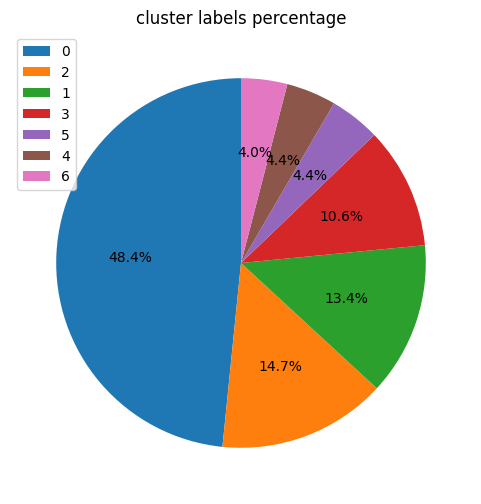

In [ ]:
# FIT K-MEANS

# Use the best parameters found
best_kmeans_params = {
    'n_clusters': overall_best_params['n_clusters'],
    'init': overall_best_params['init'],
    'n_init': overall_best_params['n_init'],
    'copy_x': overall_best_params['copy_x'],
    'algorithm': overall_best_params['algorithm'],
    'random_state': 4 #3
}

# Fit the KMeans, adjust it to the data & obtain the labels
best_kmeans = KMeans(**best_kmeans_params); best_kmeans.fit(tfidf_matrix_df); position_clusterLabels = best_kmeans.labels_

# Add the cluster labels to the dataframe
tfidf_matrix_df_ = tfidf_matrix_df.copy(); jobs_ = jobs.copy()
tfidf_matrix_df_['position_clusterLabels'] = position_clusterLabels; jobs_['position_clusterLabels'] = position_clusterLabels

# Obtain the number of samples for each cluster
position_clusterLabels=tfidf_matrix_df_['position_clusterLabels'].value_counts(); print(position_clusterLabels)

# Obtain the centroids of the clusters, the inertia & the number of iterations required to converge
centroids = best_kmeans.cluster_centers_; inertia = best_kmeans.inertia_; n_iter = best_kmeans.n_iter_
print("\nInertia:",inertia); print("\nN_iter:",n_iter)

# Plot pie 
cluster_labels_plot=position_clusterLabels.plot(kind='pie', autopct='%1.1f%%', startangle=90, legend=True, fontsize=10, labels=None, title='cluster labels percentage',figsize=(6,6))
plt.ylabel(''); plt.show()

In [ ]:
# DEFINING HEACH CLUSTER BY THE MOST COMMON KEYWORD/S

# Group by cluster_labels and count the frequency of each token
cluster_keywords = jobs_.groupby('position_clusterLabels')['position_tokens'].value_counts()

# Define a function to get the keyword with the highest count of values for each cluster
def get_most_common_keyword(row):
    cluster_label = row['position_clusterLabels']
    cluster_keywords_counts = cluster_keywords.get(cluster_label)
    if cluster_keywords_counts is None: # If there are no keywords for the cluster, return None
        return None
    most_common_keyword = cluster_keywords_counts.index[0]
    if most_common_keyword == '': # If the most common kw is an empty string, take the second most common
        if len(cluster_keywords_counts) > 1:
            most_common_keyword = cluster_keywords_counts.index[1]
        else:
            most_common_keyword = None  # Si no hay una segunda palabra clave, devuelve None
    return most_common_keyword

# Apply the function to each row of the DataFrame and add the results as a new column
jobs_['mostCommonKeyword'] = jobs_.apply(get_most_common_keyword, axis=1)

# Map the cluster numbers to the explanatory words
cluster_labels = jobs_['position_clusterLabels'].unique()
cluster_keyword_dict = {
    cluster: jobs_[jobs_['position_clusterLabels'] == cluster]['mostCommonKeyword'].iloc[0][:40] for cluster in cluster_labels
}

cluster_keyword = jobs_.groupby('position_clusterLabels')['mostCommonKeyword'].value_counts(); cluster_keyword

position_clusterLabels  mostCommonKeyword              
0                       business intelligence developer    755
1                       data scientist                     209
2                       data engineer                      230
3                       data analyst                       166
4                       machine learning engineer           68
5                       product manager                     69
6                       data architect                      63
Name: count, dtype: int64

### Visualizations

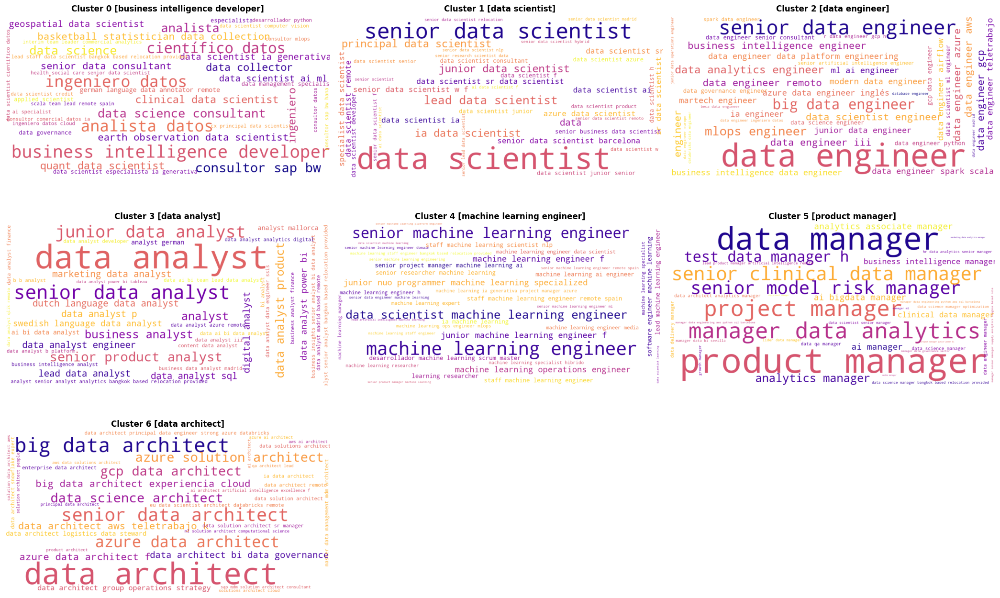

In [ ]:
# BUILD WORD CLOUDS FOR EACH CLUSTER BASED ON THE MOST COMMON KEYWORDS

# Find the total number of rows and columns to organize the subplots (Limitar el número de columnas a 3)
num_clusters = overall_best_params['n_clusters']; num_rows = int(np.ceil(num_clusters / 3)); num_cols = min(num_clusters, 3)

# Configure the size of the plot based on the number of rows and columns
plt.figure(figsize=(7 * num_cols, 4.5 * num_rows))

# Iterate over each group and create a word cloud for each one
for cluster, keywords in cluster_keywords.groupby(level=0):
    wordcloud_dict = {str(k[1]): v for k, v in keywords.items()} # Convert the Series object to a Python dictionary, taking only the keyword and its frequency

    # Create the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', prefer_horizontal=0.7, max_words=40, colormap='plasma', ranks_only=True, scale=1.5, font_step=2, random_state=42).generate_from_frequencies(wordcloud_dict)
    
    # Show the word cloud for the current group
    plt.subplot(num_rows, num_cols, cluster + 1); plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Cluster {cluster} [{cluster_keyword_dict[cluster]}]', fontweight='bold'); plt.axis('off')

plt.tight_layout(); plt.show() # Show the plot

In [ ]:
# BUILD SKILLS BY CLUSTER DF TO ANALYZE THE SKILLS BY TYPE OF JOB

# Adequate the 'skillSet' column
jobs_['skillSet'] = jobs_['skillSet'].str.replace(r' y \d+ más', '', regex=True)
jobs_['skillSet'] = jobs_['skillSet'].str.replace(r'Aptitudes: ', '', regex=True)
jobs_['skillSet'] = jobs_['skillSet'].str.replace(', ', ' || ')

grouped_jobs = jobs_.groupby('position_clusterLabels') # Grouping by cluster labels

cluster_skills_counts = {} # Dict to store the counts of each skill by cluster

# Iterate over each group and count the frequency of each skill
for label, group in grouped_jobs:
    group['skillSet'] = group['skillSet'].astype(str) # Convert all values in the 'skillSet' column to strings
    all_skills = ' || '.join(group['skillSet'].values) # Concat all the skills into a single text
    all_skills_list = all_skills.split(' || ') # Split the text into a list of skills
    skill_counts = Counter(all_skills_list) # Count the frequency of each skill
    top_skills = dict(skill_counts.most_common(20)) # Get the 20 most common skills
    cluster_skills_counts[label] = top_skills # Add the counts to the dictionary

# Convert the dictionary to a DataFrame
grouped_jobs_df = pd.DataFrame(cluster_skills_counts).fillna(0).astype(int).T.reset_index()
grouped_jobs_df.rename(columns={'index': 'Cluster'}, inplace=True) # Rename the index column to 'Cluster'
grouped_jobs_df.set_index('Cluster', inplace=True) # Set the 'Cluster' column as the index
grouped_jobs_df.loc['Total'] = grouped_jobs_df.sum() # Add a row with the total frequency of skills for each cluster
grouped_jobs_df = grouped_jobs_df[grouped_jobs_df.sum().sort_values(ascending=False).index] # Sort the columns by total frequency (descending)

grouped_jobs_df_30 = grouped_jobs_df.iloc[:,:30]; grouped_jobs_df_30 # restrict the number of columns to the top 30 & display the DataFrame

,Ciencia de datos,Python,Analítica de datos,Comunicación,SQL,Ingeniería de datos,Procesamiento de lenguaje natural,Inglés,Analítica,Capacidad de análisis,...,Aprendizaje profundo,Aprendizaje automático,Modelado de datos,Almacenamiento de datos,Reconocimiento de patrones,R (Lenguaje de programación),Apache Spark,Amazon Web Services (AWS),Big data,Microsoft Azure
Cluster,,,,,,,,,,,,,,,,,,,,,
0,203,148,105,139,124,77,90,143,93,88,...,0,0,0,0,0,0,0,0,0,0
1,165,72,90,36,42,45,101,0,47,25,...,60,44,0,0,33,32,0,0,0,0
2,64,75,41,45,56,98,0,28,23,0,...,0,0,50,55,0,0,42,20,29,19
3,34,21,71,50,48,0,0,26,37,64,...,0,0,0,0,0,0,0,0,0,0
4,36,28,0,17,8,16,26,0,0,0,...,23,36,0,0,24,10,0,8,0,0
5,7,0,7,19,5,5,0,11,10,10,...,0,0,0,0,0,0,0,0,0,0
6,7,9,7,9,6,17,0,7,0,0,...,0,0,18,8,0,0,0,14,13,14
Total,516,353,321,315,289,258,217,215,210,187,...,83,80,68,63,57,42,42,42,42,33


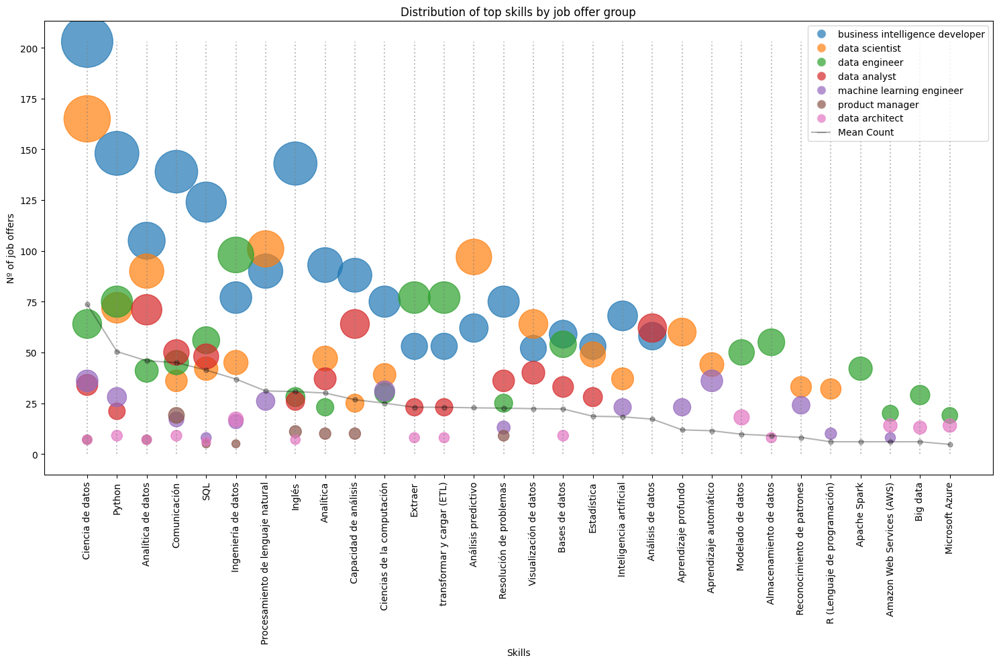

In [ ]:
# PLOT THE DISTRIBUTION OF TOP SKILLS BY JOB OFFER GROUP

# Prepare for plotting
grouped_jobs_df_plot = grouped_jobs_df_30.drop('Total') # Drop the 'Total' row
skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
plt.figure(figsize=(15, 10)); legend_elements = [] # Config the size of the plot & Build a list to store the legend elements

# Iterate over each group and draw a scatter plot for each one
for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
    cluster_skills = data.values # Extract the skill counts for the group
    plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
    legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster])) # Add a legend

# Draw the line for the mean skill counts
total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend

# Add vertical lines at each point
max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
for i, count in enumerate(total_counts):
    plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)

# Configure the plot
plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
plt.title('Distribution of top skills by job offer group')
plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot

In [ ]:
# BUILD A DICT WITH THE TOP 20 SKILLS BY CLUSTER

unique_skills = {}
for cluster, skills_counts in cluster_skills_counts.items(): # Iterating over each cluster and its skills counts
    sills = []
    for skill in skills_counts.keys(): # Iterating over each skill in the cluster
           sills.append(skill)
    unique_skills[cluster] = sills

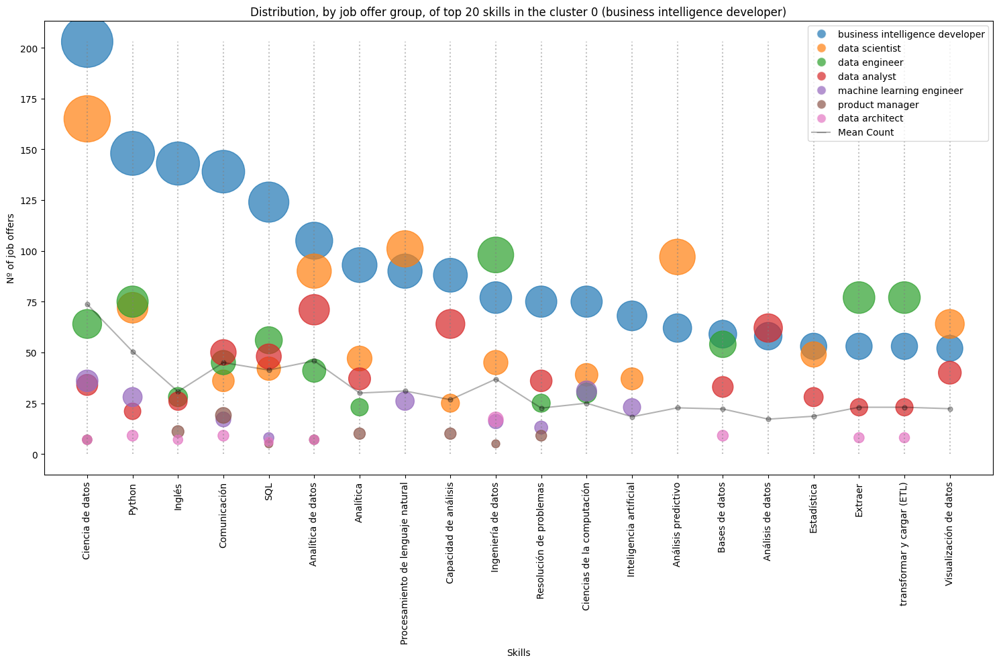

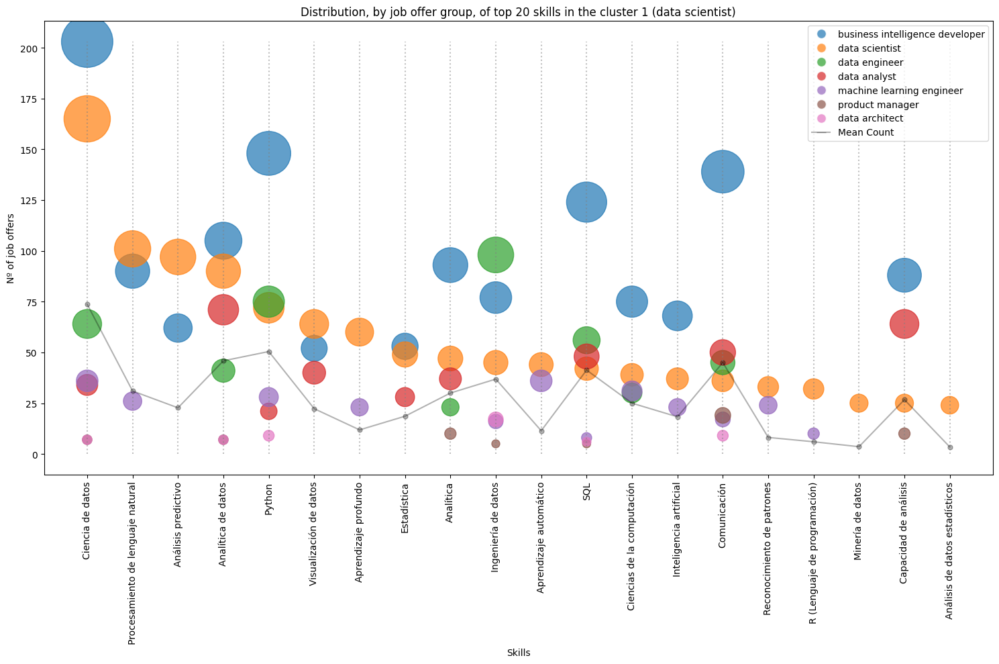

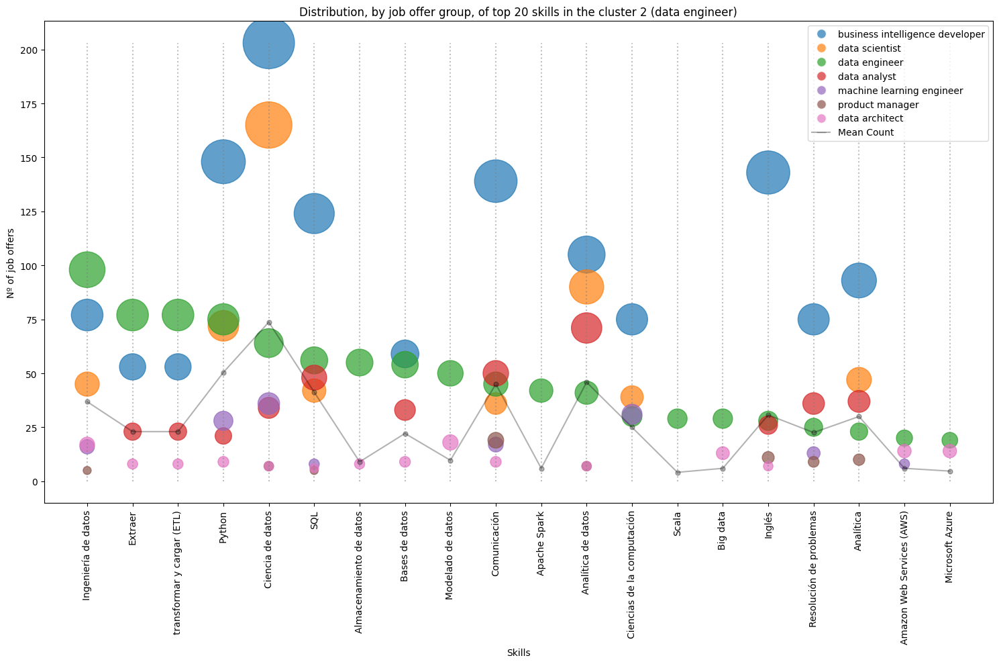

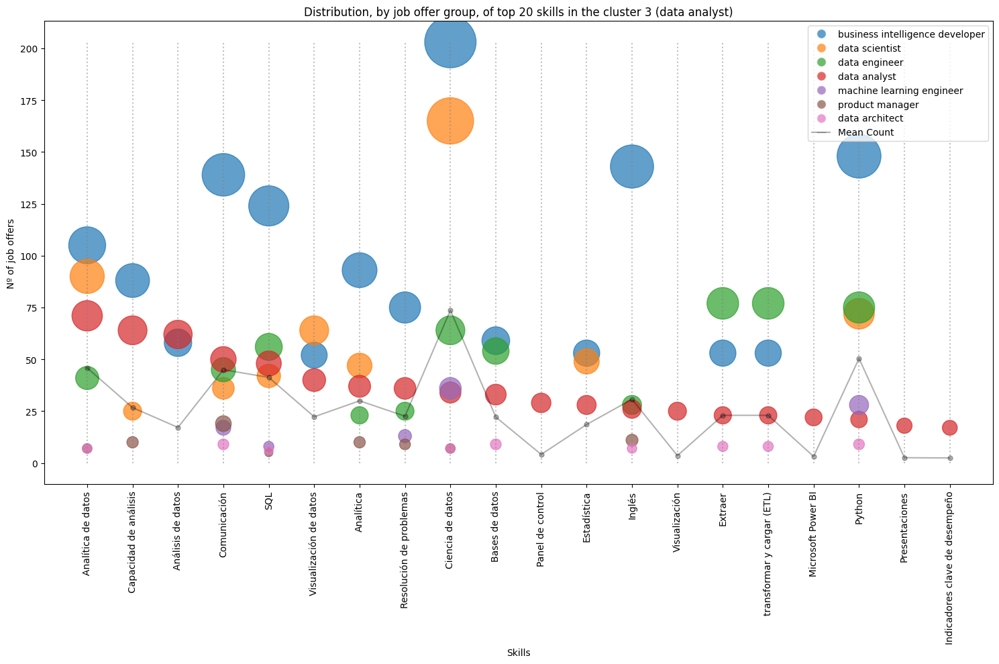

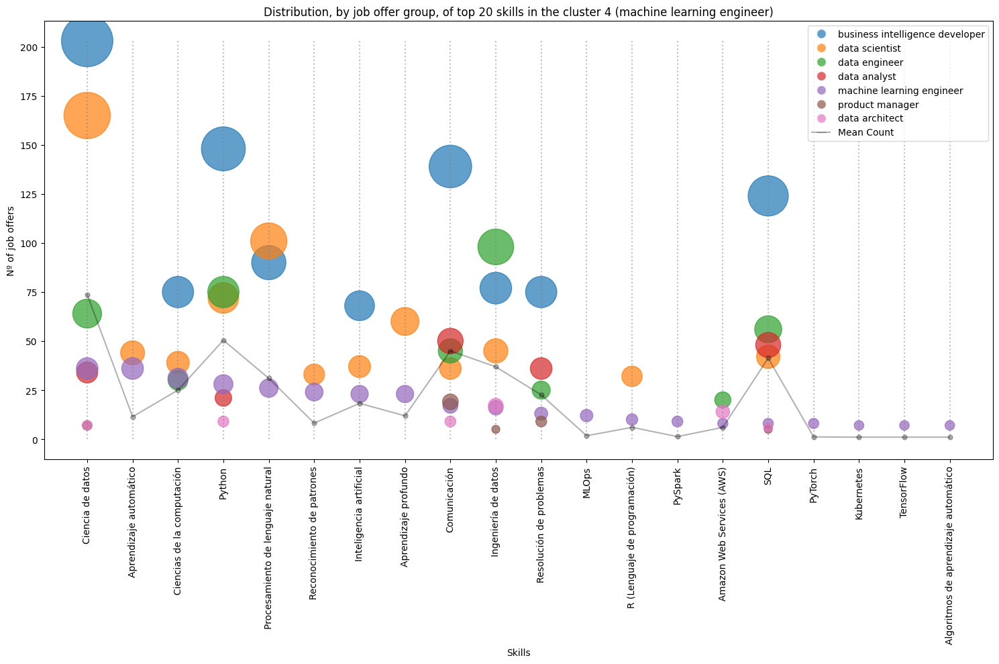

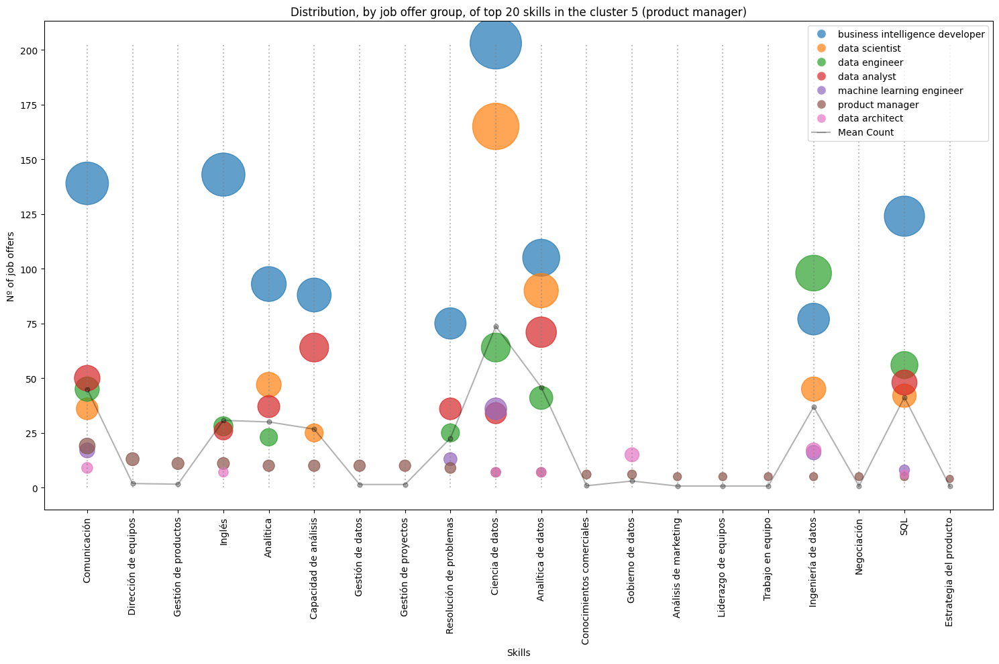

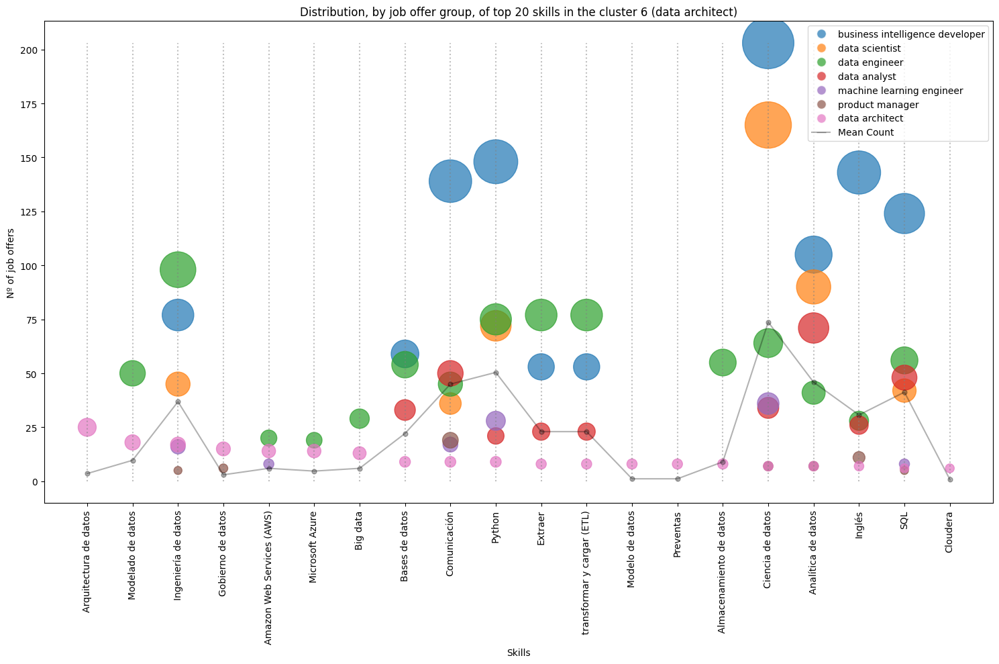

In [ ]:
for k in unique_skills.keys(): # Iterating over each cluster

    # Prepare for plotting
    grouped_jobs_df_plot = grouped_jobs_df.loc[:,unique_skills[k]].drop('Total') # Select the skills for the cluster and drop the 'Total' row
    skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
    colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
    plt.figure(figsize=(15, 10));legend_elements = [] # Config the size of the plot & Build a list to store the legend elements
    
    # Iterate over each group and draw a scatter plot for each one
    for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
        cluster_skills = data.values # Extract the skill counts for the group
        plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster]))  # Add a legend
    
    # Draw the line for the mean skill counts
    total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
    plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
    legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend
    
    # Add vertical lines at each point
    max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
    for i, count in enumerate(total_counts):
        plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)
    
    
    # Configure the plot
    plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
    plt.title(f'Distribution, by job offer group, of top 20 skills in the cluster {k} ({cluster_keyword_dict[k]})')
    plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot

## Grouping by Location (place)

### Adequate Data

In [ ]:
# Apply the function to the "job_position" column and create a new column "clean_tokens"
jobs_['place_tokens'] = jobs_['place'].apply(clean_and_tokenize)

# delete "españa" & "alrededores" from the tokens
jobs_['place_tokens'] = jobs_['place_tokens'].apply(lambda x: [word for word in x if word not in ['españa','alrededores']])

# Filter 'howLong' column and get the word list
jobs_['place_tokens'], wordList = filter_words_by_frequency(jobs_['place_tokens'])

In [ ]:
# Calculate TF-IDF for grouping by job position with KMeans
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(jobs_['place_tokens'])
tfidf_matrix_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out()) # tfidf_matrix as dataframe

### Find best K & hiperparameters

In [ ]:
# FIND BEST K WITH GAP STATISTICS

k_max = min(15, max(5,round(len(wordList)**(1/3)))) # Define max number of clusters
k_min = min(10, max(2,round(len(wordList)**(1/5)))) # Define min number of clusters

# Call the function to find the optimal k with gap statistics
optimal_ks_gap_statistics = find_optimal_k_gap_statistics(tfidf_matrix_df, max_clusters=k_max, num_iterations=15, num_splits=5, k_min=k_min)
k_importances_gap=optimal_ks_gap_statistics[1]

# Print k_min, k_max, k_dict and k_importances_gap
print("k_min: ", k_min); print("k_max: ", k_max); print("k dict: ", optimal_ks_gap_statistics[0]); print("k importances gap: ", optimal_ks_gap_statistics[1])

c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\clus

k_min:  3
k_max:  5
k dict:  {3: 1.0164395626179044, 2: 0.9665119007911708, 5: 0.7389801996155465, 4: 0.7367669634369401}
k importances gap:  {3: 0.407850484134364, 5: 0.29651879291539157, 4: 0.2956307229502444}


c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\clus

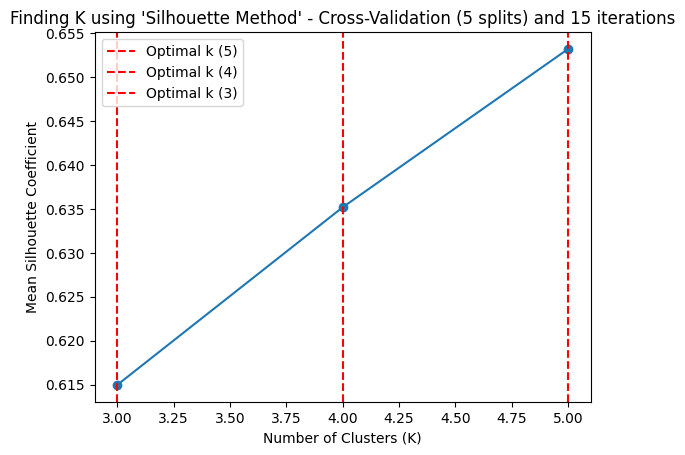

Top 3 optimal number of clusters (k): [5, 4, 3]


In [ ]:
# SILHOUETTE METHOD WITH CROSS-VALIDATION (K-FOLD) AND MULTIPLE ITERATIONS

num_iterations = 15; num_splits = 5; silhouette_scores = [] # Define the nº iterations, nº splits in CV & List to store the results of silhouette scores

# Loop over each iteration
for iteration in range(num_iterations):
    silhouette_scores_iteration = [] # Scores of each K & split [for this iteration]
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration) # CV object for this iteration
    
    # Loop over each split
    for train_index, _ in kf.split(tfidf_matrix_df):
        X_train = tfidf_matrix_df.iloc[train_index] # Training data for this split
        silhouette_k = [] # Scores of each K [for this split]

        # Loop over each K
        for k in range(k_min, k_max + 1):
            kmeans = KMeans(n_clusters=k, random_state=iteration)
            labels = kmeans.fit_predict(X_train)
            score = silhouette_score(X_train, labels)
            silhouette_k.append(score)
        
        silhouette_scores_iteration.append(silhouette_k) # Store the silhuette results of each K, each split [for this iteration]
    silhouette_scores.extend(silhouette_scores_iteration) # Extend will add each element of that list separately to the end of the original list [not list of list]
silhouette_mean = np.mean(silhouette_scores, axis=0) # Calculate mean silhouette scores for each k across all iterations and splits

# Dict with k as key and mean_score_k as value
k_list = range(k_min, k_max + 1)
k_dict = {k_list[i]: silhouette_mean[i] for i in range(len(k_list))}
k_dict = dict(sorted(k_dict.items(), key=lambda item: item[1], reverse=True))
k_importances_sil = {k: v/sum(k_dict.values()) for k, v in k_dict.items()}

# Plot the silhouette coefficient curve
plt.plot(range(k_min, k_max + 1), silhouette_mean, marker='o')
plt.xlabel('Number of Clusters (K)'); plt.ylabel('Mean Silhouette Coefficient')
plt.title(f"Finding K using 'Silhouette Method' - Cross-Validation ({num_splits} splits) and {num_iterations} iterations")

for k_value in list(k_dict.keys())[0:3]: # Add a vertical line for the top 3 optimal number of clusters
    plt.axvline(x=k_value, color='r', linestyle='--', label=f'Optimal k ({k_value})')

plt.legend(); plt.show(); print(f'Top 3 optimal number of clusters (k): {list(k_dict.keys())[0:3]}') # Show results

c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\clus

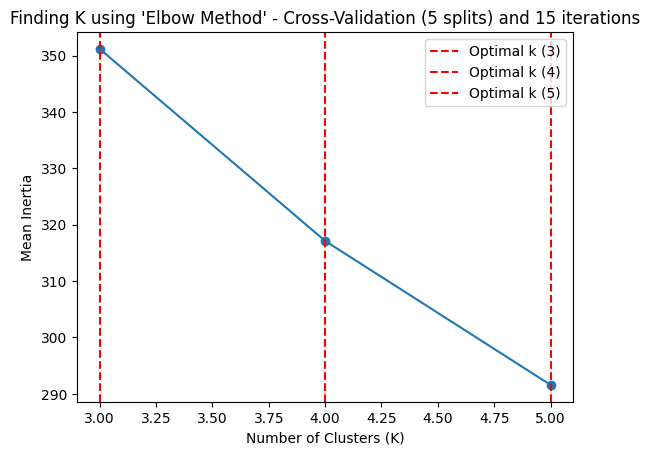

Top 3 optimal number of clusters (k): [3, 4, 5]


In [ ]:
# ELBOW METHOD WITH CROSS-VALIDATION (K-FOLD) AND MULTIPLE ITERATIONS

num_iterations = 15; num_splits = 5; inertia_iterations = [] # Define the nº iterations, nº splits in CV & List to store the results of inertia scores

# Loop over each iteration
for iteration in range(num_iterations):
    inertia_iteration = [] 
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)

    # Loop over each split
    for train_index, _ in kf.split(tfidf_matrix_df):
        X_train = tfidf_matrix_df.iloc[train_index]
        inertia_k = []
        
        # Loop over each K
        for k in range(k_min, k_max + 1):
            kmeans = KMeans(n_clusters=k, random_state=iteration)
            kmeans.n_clusters = k # Actualize the number of clusters in the KMeans object
            kmeans.fit(X_train) # Fit the KMeans object with the training data
            inertia_k.append(kmeans.inertia_) # Store the inertia of each K [for this split]
        
        inertia_iteration.append(inertia_k) # Store the inertia results of each K, each split [for this iteration]
    inertia_iterations.extend(inertia_iteration) # Store the inertia results of each K, each split, each iteration
inertia_mean = np.mean(inertia_iterations, axis=0) # Calculate mean silhouette scores for each k across all iterations and splits

# Dict with k as key and mean_score_k as value
k_list = range(k_min, k_max + 1)
k_dict = {k_list[i]: inertia_mean[i] for i in range(len(k_list))}
k_dict = dict(sorted(k_dict.items(), key=lambda item: item[1], reverse=True))
k_importances_elbow = {k: v/sum(k_dict.values()) for k, v in k_dict.items()} # Dict with k as key and importance as value

# Plot the silhouette coefficient curve
plt.plot(range(k_min, k_max + 1), inertia_mean, marker='o')
plt.xlabel('Number of Clusters (K)'); plt.ylabel('Mean Inertia')
plt.title(f"Finding K using 'Elbow Method' - Cross-Validation ({num_splits} splits) and {num_iterations} iterations")

for k_value in list(k_dict.keys())[0:3]:# Add a vertical line for the top 3 optimal number of clusters
    plt.axvline(x=k_value, color='r', linestyle='--', label=f'Optimal k ({k_value})')

plt.legend(); plt.show(); print(f'Top 3 optimal number of clusters (k): {list(k_dict.keys())[0:3]}') # Show results

In [ ]:
# COMBINE THE IMPORTANCES OF THE THREE METHODS

k_importances = {}
for key in k_importances_gap.keys(): # Iterate over the keys of one of the dictionaries
    # Sum the corresponding values of the 3 dictionaries and store them on k_importances
    k_importances[key] = k_importances_gap[key] + k_importances_sil[key] + k_importances_elbow[key]

# Sort the dictionary by value in descending order
k_importances = dict(sorted(k_importances.items(), key=lambda item: item[1], reverse=True)); print(k_importances)

{3: 1.0967965677560023, 4: 0.9597284308582954, 5: 0.9434750013857023}


In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],  # Range of k based on the optimal k
    'init': ['k-means++', 'random'],
    'copy_x': [True, False],
    'algorithm': ['elkan', 'lloyd'],
    'random_state': [43]
}

num_iterations = 15; num_splits = 5; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\clus

Overall Best Parameters: {'algorithm': 'lloyd', 'copy_x': True, 'init': 'k-means++', 'n_clusters': 5, 'random_state': 43}
Overall Best Score: -72.83272270705955


In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid Based on previous Overall Best Parameters
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],
    'init': [overall_best_params['init']],
    'n_init': [10, 50, 100],
    'copy_x': [overall_best_params['copy_x']],
    'algorithm': ['elkan', 'lloyd'],
    'random_state': [43]
}

num_iterations = 5; num_splits = 3; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

Overall Best Parameters: {'algorithm': 'elkan', 'copy_x': True, 'init': 'k-means++', 'n_clusters': 5, 'n_init': 50, 'random_state': 43}
Overall Best Score: -120.84009062516482


In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid based on previous Overall Best Parameters
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],
    'init': [overall_best_params['init']],
    'n_init': [max(10,overall_best_params['n_init']-20), overall_best_params['n_init'], min(150,overall_best_params['n_init']+20)],
    'copy_x': [overall_best_params['copy_x']],
    'algorithm': [overall_best_params['algorithm']],
    'random_state': [43]
}

num_iterations = 5; num_splits = 3; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

Overall Best Parameters: {'algorithm': 'elkan', 'copy_x': True, 'init': 'k-means++', 'n_clusters': 5, 'n_init': 50, 'random_state': 43}
Overall Best Score: -120.84009062516482


In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid based on previous Overall Best Parameters
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],
    'init': [overall_best_params['init']],
    'n_init': [overall_best_params['n_init'], 150, 'auto'],
    'copy_x': [overall_best_params['copy_x']],
    'algorithm': [overall_best_params['algorithm']],
    'random_state': [43]
}

num_iterations = 5; num_splits = 3; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

Overall Best Parameters: {'algorithm': 'elkan', 'copy_x': True, 'init': 'k-means++', 'n_clusters': 5, 'n_init': 50, 'random_state': 43}
Overall Best Score: -120.84009062516482


### Fit K-Means & Define groups

place_clusterLabels
0    582
4    449
1    392
3     91
2     46
Name: count, dtype: int64

Inertia: 359.64662849547

N_iter: 4


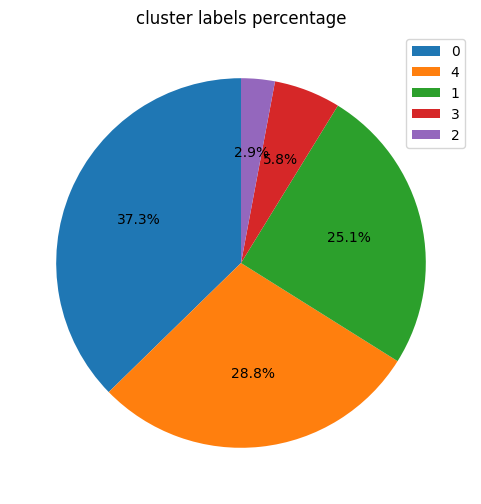

In [ ]:
# FIT K-MEANS

# Use the best parameters found
best_kmeans_params = {
    'n_clusters': overall_best_params['n_clusters'],
    'init': overall_best_params['init'],
    'n_init': overall_best_params['n_init'],
    'copy_x': overall_best_params['copy_x'],
    'algorithm': overall_best_params['algorithm'],
    'random_state': 4 #3
}

# Fit the KMeans, adjust it to the data & obtain the labels
best_kmeans = KMeans(**best_kmeans_params); best_kmeans.fit(tfidf_matrix_df); position_clusterLabels = best_kmeans.labels_

# Add the cluster labels to the dataframe
tfidf_matrix_df_['place_clusterLabels'] = position_clusterLabels; jobs_['place_clusterLabels'] = position_clusterLabels

# Obtain the number of samples for each cluster
position_clusterLabels=tfidf_matrix_df_['place_clusterLabels'].value_counts(); print(position_clusterLabels)

# Obtain the centroids of the clusters, the inertia & the number of iterations required to converge
centroids = best_kmeans.cluster_centers_; inertia = best_kmeans.inertia_; n_iter = best_kmeans.n_iter_
print("\nInertia:",inertia); print("\nN_iter:",n_iter)

# Plot pie 
cluster_labels_plot=position_clusterLabels.plot(kind='pie', autopct='%1.1f%%', startangle=90, legend=True, fontsize=10, labels=None, title='cluster labels percentage',figsize=(6,6))
plt.ylabel(''); plt.show()

In [ ]:
# DEFINING HEACH CLUSTER BY THE MOST COMMON KEYWORD/S

# Group by cluster_labels and count the frequency of each token
cluster_keywords = jobs_.groupby('place_clusterLabels')['place_tokens'].value_counts()

# Define a function to get the keyword with the highest count of values for each cluster
def get_most_common_keyword(row):
    cluster_label = row['place_clusterLabels']
    cluster_keywords_counts = cluster_keywords.get(cluster_label)
    if cluster_keywords_counts is None: # If there are no keywords for the cluster, return None
        return None
    most_common_keyword = cluster_keywords_counts.index[0]
    if most_common_keyword == '': # If the most common kw is an empty string, take the second most common
        if len(cluster_keywords_counts) > 1:
            most_common_keyword = cluster_keywords_counts.index[1]
        else:
            most_common_keyword = None  # Si no hay una segunda palabra clave, devuelve None
    return most_common_keyword

# Apply the function to each row of the DataFrame and add the results as a new column
jobs_['place_mostCommonKeyword'] = jobs_.apply(get_most_common_keyword, axis=1)

# Map the cluster numbers to the explanatory words
cluster_labels = jobs_['place_clusterLabels'].unique()
cluster_keyword_dict = {
    cluster: jobs_[jobs_['place_clusterLabels'] == cluster]['place_mostCommonKeyword'].iloc[0][:40] for cluster in cluster_labels
}

cluster_keyword = jobs_.groupby('place_clusterLabels')['place_mostCommonKeyword'].value_counts(); cluster_keyword

place_clusterLabels  place_mostCommonKeyword                                    
0                    madrid comunidad madrid                                        582
1                    barcelona cataluña                                             392
2                    valencia valència comunidad valenciana comunitat valenciana     46
3                    málaga andalucía                                                91
4                    país vasco euskadi                                             449
Name: count, dtype: int64

### Visualizations

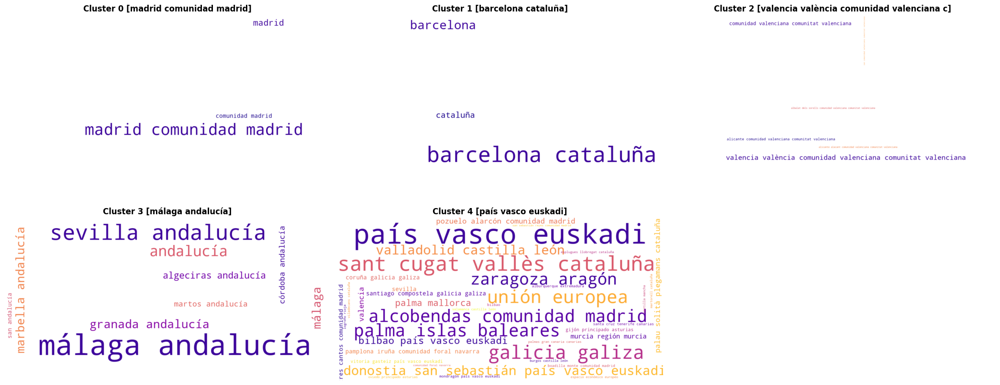

In [ ]:
# BUILD WORD CLOUDS FOR EACH CLUSTER BASED ON THE MOST COMMON KEYWORDS

# Find the total number of rows and columns to organize the subplots (Limitar el número de columnas a 3)
num_clusters = overall_best_params['n_clusters']; num_rows = int(np.ceil(num_clusters / 3)); num_cols = min(num_clusters, 3)

# Configure the size of the plot based on the number of rows and columns
plt.figure(figsize=(7 * num_cols, 4.5 * num_rows))

# Iterate over each group and create a word cloud for each one
for cluster, keywords in cluster_keywords.groupby(level=0):
    wordcloud_dict = {str(k[1]): v for k, v in keywords.items()} # Convert the Series object to a Python dictionary, taking only the keyword and its frequency

    # Create the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', prefer_horizontal=0.7, max_words=40, colormap='plasma', ranks_only=True, scale=1.5, font_step=2, random_state=42).generate_from_frequencies(wordcloud_dict)
    
    # Show the word cloud for the current group
    plt.subplot(num_rows, num_cols, cluster + 1); plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Cluster {cluster} [{cluster_keyword_dict[cluster]}]', fontweight='bold'); plt.axis('off')

plt.tight_layout(); plt.show() # Show the plot

In [ ]:
# BUILD SKILLS BY CLUSTER DF TO ANALYZE THE SKILLS BY TYPE OF JOB

grouped_jobs = jobs_.groupby('place_clusterLabels') # Grouping by cluster labels

cluster_skills_counts = {} # Dict to store the counts of each skill by cluster

# Iterate over each group and count the frequency of each skill
for label, group in grouped_jobs:
    group['skillSet'] = group['skillSet'].astype(str) # Convert all values in the 'skillSet' column to strings
    all_skills = ' || '.join(group['skillSet'].values) # Concat all the skills into a single text
    all_skills_list = all_skills.split(' || ') # Split the text into a list of skills
    skill_counts = Counter(all_skills_list) # Count the frequency of each skill
    top_skills = dict(skill_counts.most_common(20)) # Get the 20 most common skills
    cluster_skills_counts[label] = top_skills # Add the counts to the dictionary

# Convert the dictionary to a DataFrame
grouped_jobs_df = pd.DataFrame(cluster_skills_counts).fillna(0).astype(int).T.reset_index()
grouped_jobs_df.rename(columns={'index': 'Cluster'}, inplace=True) # Rename the index column to 'Cluster'
grouped_jobs_df.set_index('Cluster', inplace=True) # Set the 'Cluster' column as the index
grouped_jobs_df.loc['Total'] = grouped_jobs_df.sum() # Add a row with the total frequency of skills for each cluster
grouped_jobs_df = grouped_jobs_df[grouped_jobs_df.sum().sort_values(ascending=False).index] # Sort the columns by total frequency (descending)

grouped_jobs_df_30 = grouped_jobs_df.iloc[:,:30]; grouped_jobs_df_30 # restrict the number of columns to the top 30 & display the DataFrame

,Ciencia de datos,Python,Analítica de datos,Comunicación,SQL,Ingeniería de datos,Inglés,Procesamiento de lenguaje natural,Analítica,Capacidad de análisis,...,Inteligencia artificial,Aprendizaje profundo,Estadística,Matemáticas,Reconocimiento de patrones,Scala,Java,Programación orientada a objetos (POO),Calidad de datos,Documentación
Cluster,,,,,,,,,,,,,,,,,,,,,
0,192,130,115,99,120,124,92,99,90,78,...,0,61,0,0,0,0,0,0,0,0
1,150,82,112,100,76,38,58,51,70,58,...,40,0,42,41,38,0,0,0,0,0
2,11,10,6,14,7,5,6,0,5,6,...,4,0,0,0,0,0,0,0,0,4
3,22,14,16,20,10,19,16,11,0,10,...,7,0,0,0,0,10,6,6,6,0
4,141,121,75,82,76,76,61,65,49,47,...,38,0,0,0,0,0,0,0,0,0
Total,516,357,324,315,289,262,233,226,214,199,...,89,61,42,41,38,10,6,6,6,4


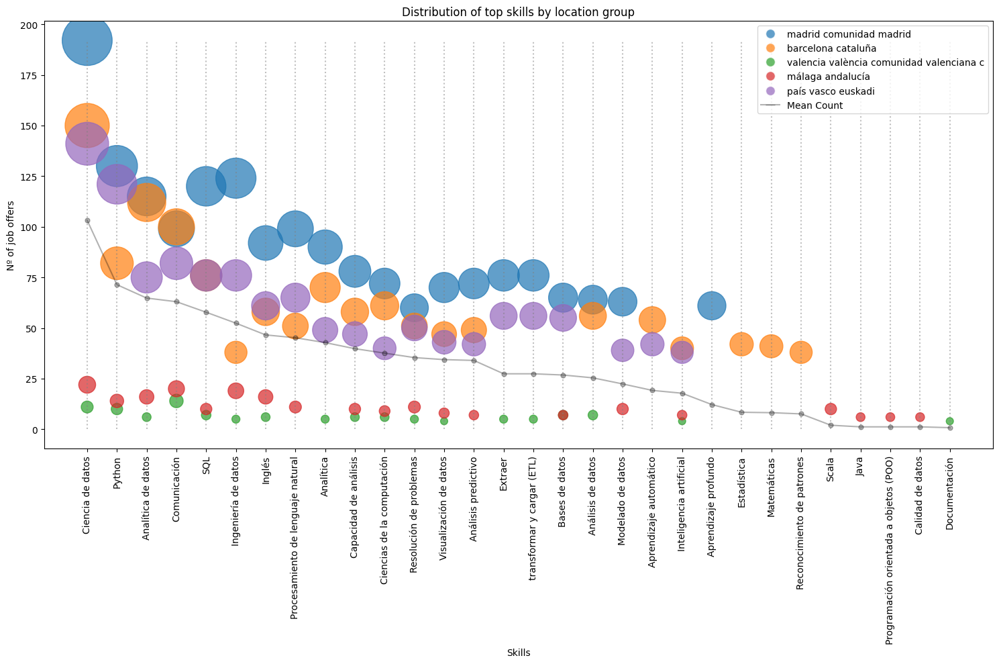

In [ ]:
# PLOT THE DISTRIBUTION OF TOP SKILLS BY JOB OFFER GROUP

# Prepare for plotting
grouped_jobs_df_plot = grouped_jobs_df_30.drop('Total') # Drop the 'Total' row
skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
plt.figure(figsize=(15, 10)); legend_elements = [] # Config the size of the plot & Build a list to store the legend elements

# Iterate over each group and draw a scatter plot for each one
for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
    cluster_skills = data.values # Extract the skill counts for the group
    plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
    legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster])) # Add a legend

# Draw the line for the mean skill counts
total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend

# Add vertical lines at each point
max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
for i, count in enumerate(total_counts):
    plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)

# Configure the plot
plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
plt.title('Distribution of top skills by location group')
plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot

In [ ]:
# BUILD A DICT WITH THE TOP 20 SKILLS BY CLUSTER

unique_skills = {}
for cluster, skills_counts in cluster_skills_counts.items(): # Iterating over each cluster and its skills counts
    sills = []
    for skill in skills_counts.keys(): # Iterating over each skill in the cluster
           sills.append(skill)
    unique_skills[cluster] = sills

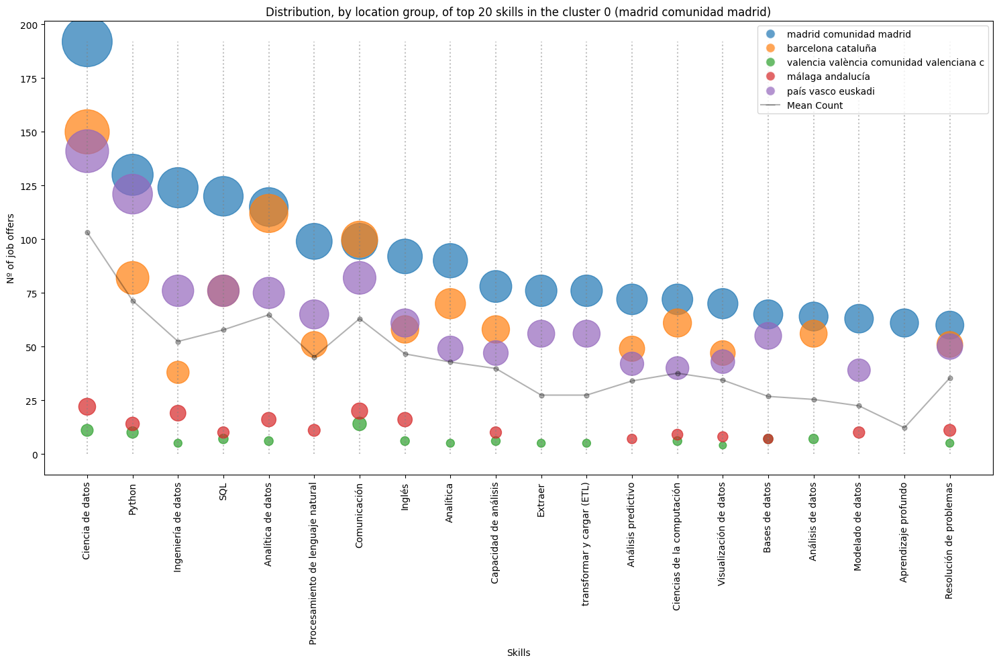

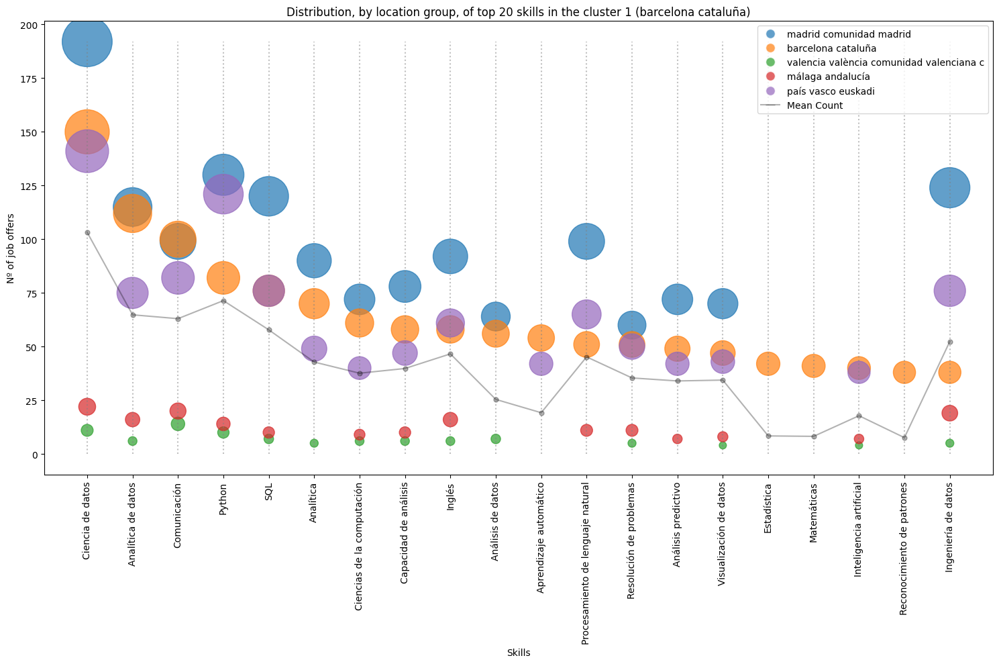

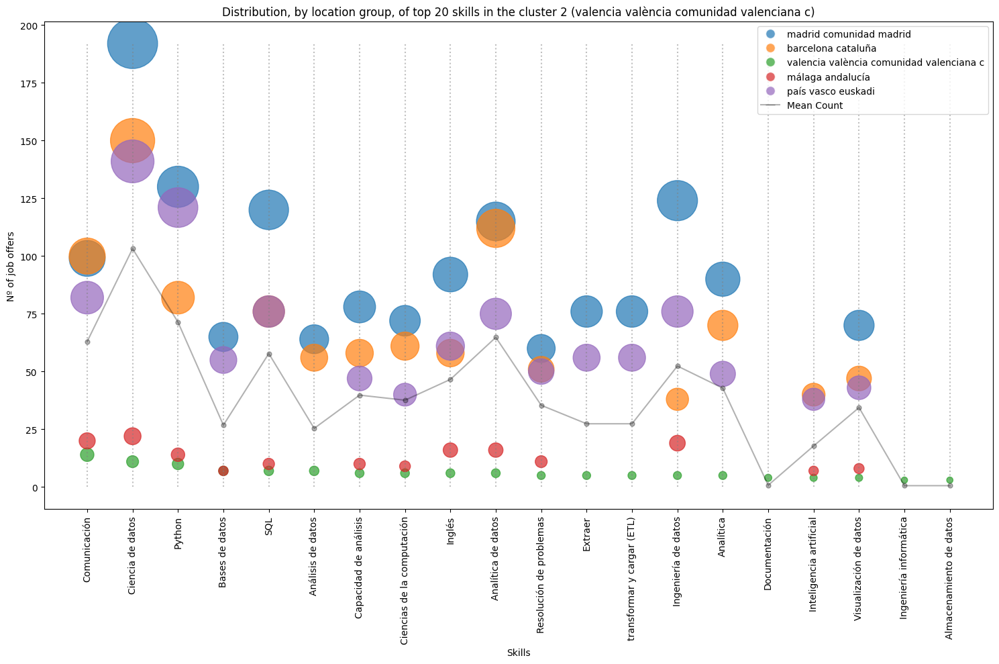

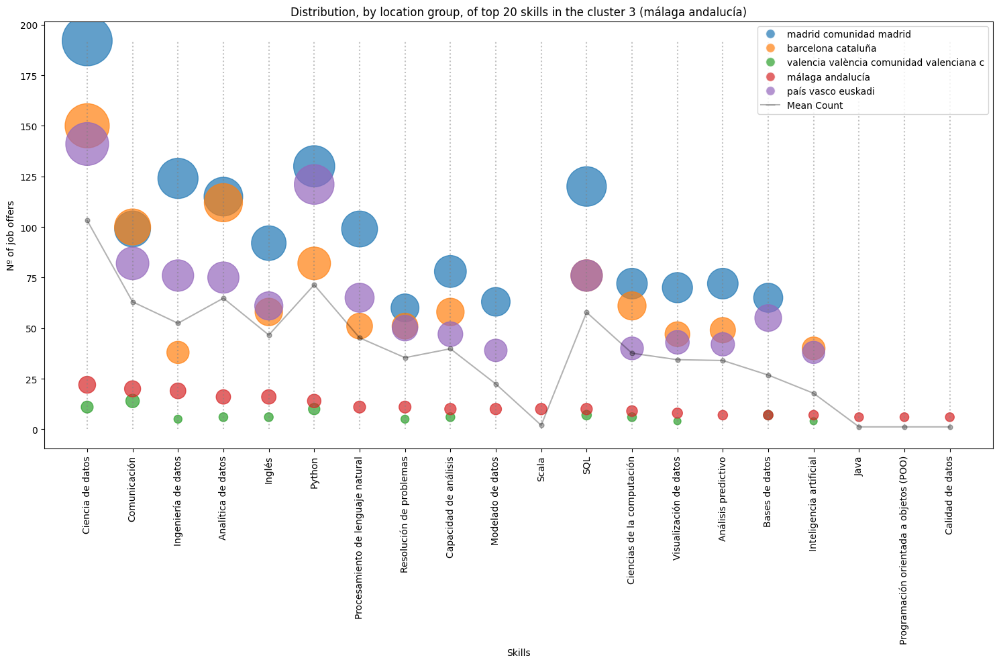

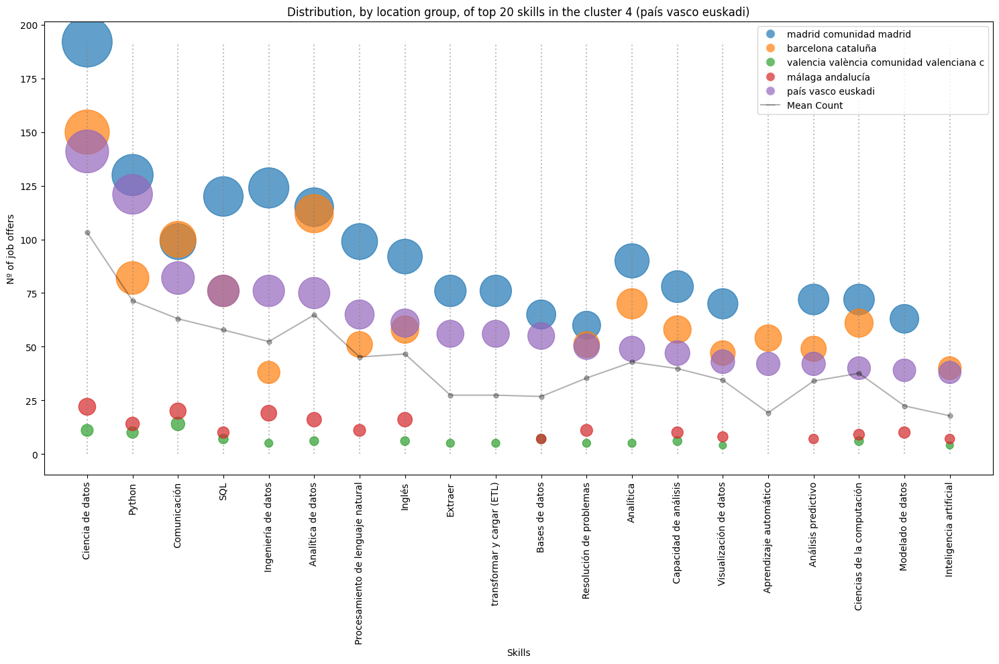

In [ ]:
for k in unique_skills.keys(): # Iterating over each cluster

    # Prepare for plotting
    grouped_jobs_df_plot = grouped_jobs_df.loc[:,unique_skills[k]].drop('Total') # Select the skills for the cluster and drop the 'Total' row
    skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
    colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
    plt.figure(figsize=(15, 10));legend_elements = [] # Config the size of the plot & Build a list to store the legend elements
    
    # Iterate over each group and draw a scatter plot for each one
    for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
        cluster_skills = data.values # Extract the skill counts for the group
        plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster]))  # Add a legend
    
    # Draw the line for the mean skill counts
    total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
    plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
    legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend
    
    # Add vertical lines at each point
    max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
    for i, count in enumerate(total_counts):
        plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)
    
    
    # Configure the plot
    plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
    plt.title(f'Distribution, by location group, of top 20 skills in the cluster {k} ({cluster_keyword_dict[k]})')
    plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot

## Grouping by nº applications

In [ ]:
# Function to extract numbers from each cell
def extract_numbers(cell):
    if cell is None:  # Check if the cell is None
        return None
    pattern = r'\d+' # Regular expression pattern to find numbers
    numbers = re.findall(pattern, cell) # Find numbers
    return int(numbers[0]) if numbers else None # Return the first number found (if any)

In [ ]:
# Apply the function to create a new column
jobs_['applications_number'] = jobs_['applications'].apply(extract_numbers)

# Define the bins for grouping
bins = [-1, 26, 51, 76, 100, 110]

# Define the labels for the bins
labels = ['0-25', '26-50', '51-75', '76-99', '100+']

# Group the values into intervals
jobs_['applications_interval'] = pd.cut(jobs_['applications_number'], bins=bins, labels=labels, right=False)

# Drop applications_number column
jobs_.drop(columns=['applications_number'], inplace=True)

# Map the cluster numbers to the explanatory words
cluster_labels = list(jobs_['applications_interval'].unique())
cluster_labels = [x for x in cluster_labels if str(x) != 'nan'] # delete 'nan'
cluster_keyword_dict = {
    cluster: jobs_[jobs_['applications_interval'] == cluster]['applications_interval'].iloc[0][:40] for cluster in cluster_labels
}

jobs_['applications_interval'].value_counts()

applications_interval
0-25     518
100+     489
26-50    272
51-75    166
76-99    107
Name: count, dtype: int64

In [ ]:
# BUILD SKILLS BY CLUSTER DF TO ANALYZE THE SKILLS BY TYPE OF JOB

grouped_jobs = jobs_.groupby('applications_interval') # Grouping by cluster labels

cluster_skills_counts = {} # Dict to store the counts of each skill by cluster

# Iterate over each group and count the frequency of each skill
for label, group in grouped_jobs:
    group['skillSet'] = group['skillSet'].astype(str) # Convert all values in the 'skillSet' column to strings
    all_skills = ' || '.join(group['skillSet'].values) # Concat all the skills into a single text
    all_skills_list = all_skills.split(' || ') # Split the text into a list of skills
    skill_counts = Counter(all_skills_list) # Count the frequency of each skill
    top_skills = dict(skill_counts.most_common(20)) # Get the 20 most common skills
    cluster_skills_counts[label] = top_skills # Add the counts to the dictionary

# Convert the dictionary to a DataFrame
grouped_jobs_df = pd.DataFrame(cluster_skills_counts).fillna(0).astype(int).T.reset_index()
grouped_jobs_df.rename(columns={'index': 'Cluster'}, inplace=True) # Rename the index column to 'Cluster'
grouped_jobs_df.set_index('Cluster', inplace=True) # Set the 'Cluster' column as the index
grouped_jobs_df.loc['Total'] = grouped_jobs_df.sum() # Add a row with the total frequency of skills for each cluster
grouped_jobs_df = grouped_jobs_df[grouped_jobs_df.sum().sort_values(ascending=False).index] # Sort the columns by total frequency (descending)

grouped_jobs_df_30 = grouped_jobs_df.iloc[:,:30]; grouped_jobs_df_30 # restrict the number of columns to the top 30 & display the DataFrame

,Ciencia de datos,Python,Analítica de datos,Comunicación,SQL,Ingeniería de datos,Inglés,Procesamiento de lenguaje natural,Analítica,Capacidad de análisis,...,Ciencias de la computación,Estadística,Modelado de datos,Análisis de datos,Aprendizaje profundo,Aprendizaje automático,Inteligencia artificial,Amazon Web Services (AWS),Apache Spark,R (Lenguaje de programación)
Cluster,,,,,,,,,,,,,,,,,,,,,
0-25,164,63,114,115,52,79,77,80,74,63,...,73,40,0,0,47,0,43,0,0,0
26-50,91,63,52,67,47,55,38,41,38,30,...,34,0,25,0,30,28,34,0,0,0
51-75,45,45,31,38,24,31,29,21,20,18,...,19,16,17,16,15,0,0,0,0,0
76-99,35,34,18,17,30,23,14,12,13,16,...,17,0,18,13,0,0,0,14,14,12
100+,173,150,106,78,134,72,75,70,73,71,...,0,52,47,66,0,58,0,0,0,0
Total,508,355,321,315,287,260,233,224,218,198,...,143,108,107,95,92,86,77,14,14,12


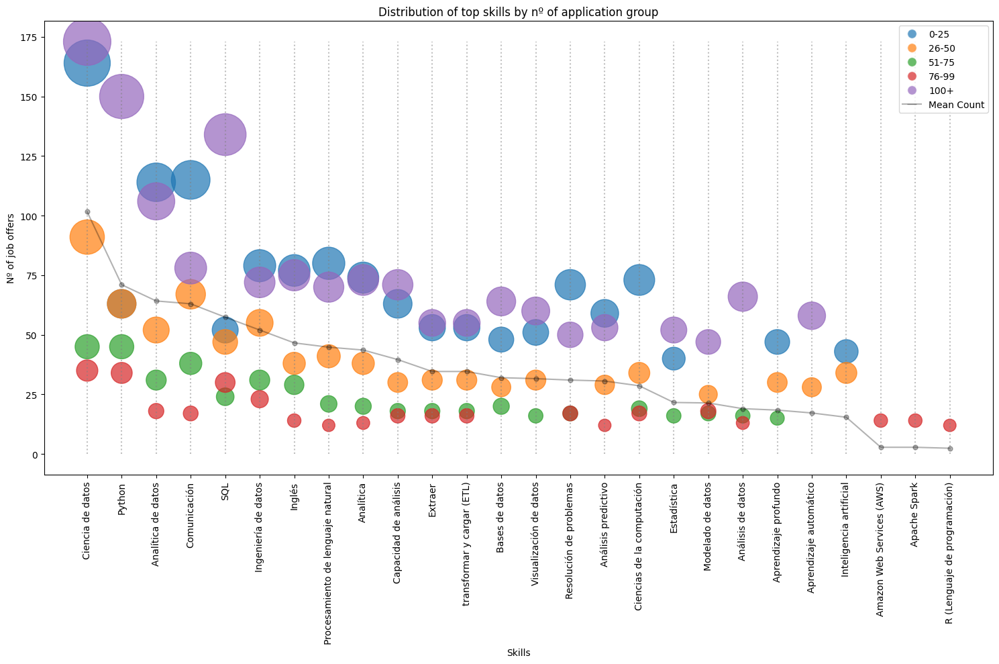

In [ ]:
# PLOT THE DISTRIBUTION OF TOP SKILLS BY JOB OFFER GROUP

# Prepare for plotting
grouped_jobs_df_plot = grouped_jobs_df_30.drop('Total') # Drop the 'Total' row
skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
plt.figure(figsize=(15, 10)); legend_elements = [] # Config the size of the plot & Build a list to store the legend elements

# Iterate over each group and draw a scatter plot for each one
for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
    cluster_skills = data.values # Extract the skill counts for the group
    plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
    legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster])) # Add a legend

# Draw the line for the mean skill counts
total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend

# Add vertical lines at each point
max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
for i, count in enumerate(total_counts):
    plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)

# Configure the plot
plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
plt.title('Distribution of top skills by nº of application group')
plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot

In [ ]:
# BUILD A DICT WITH THE TOP 20 SKILLS BY CLUSTER

unique_skills = {}
for cluster, skills_counts in cluster_skills_counts.items(): # Iterating over each cluster and its skills counts
    sills = []
    for skill in skills_counts.keys(): # Iterating over each skill in the cluster
           sills.append(skill)
    unique_skills[cluster] = sills

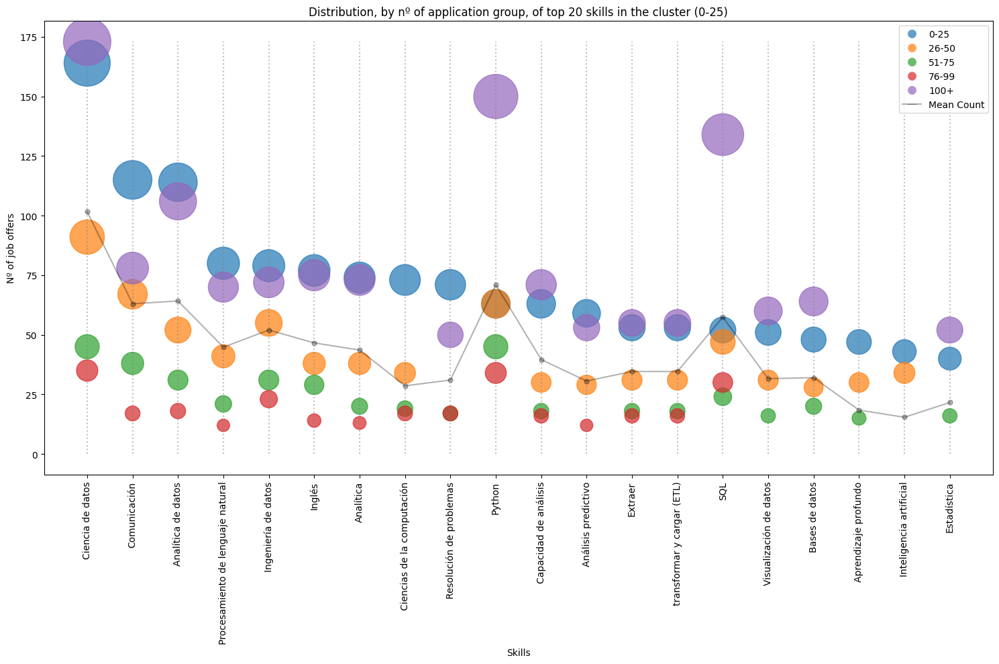

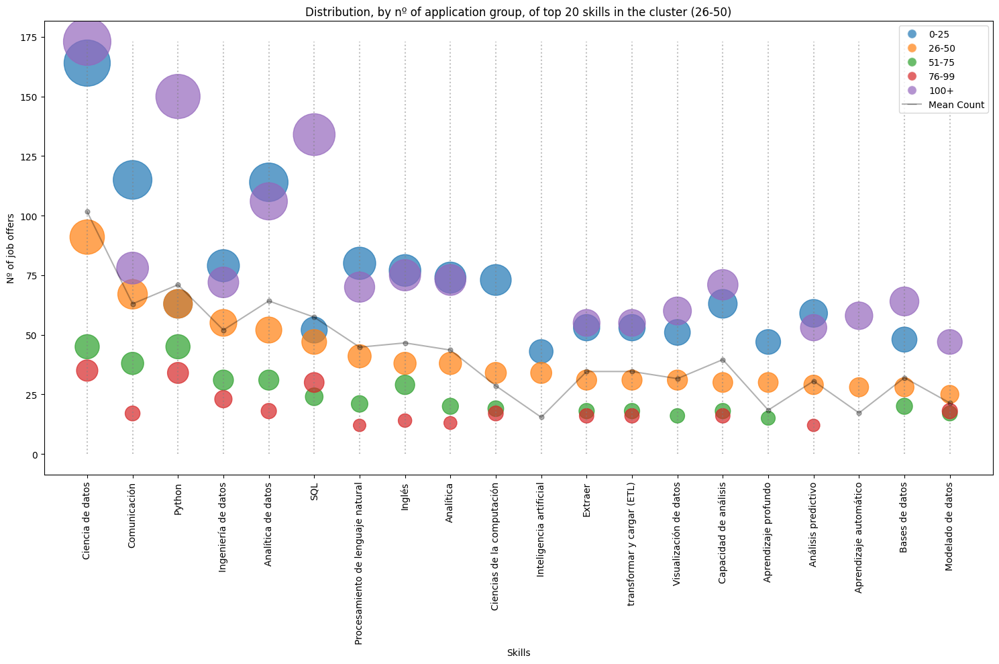

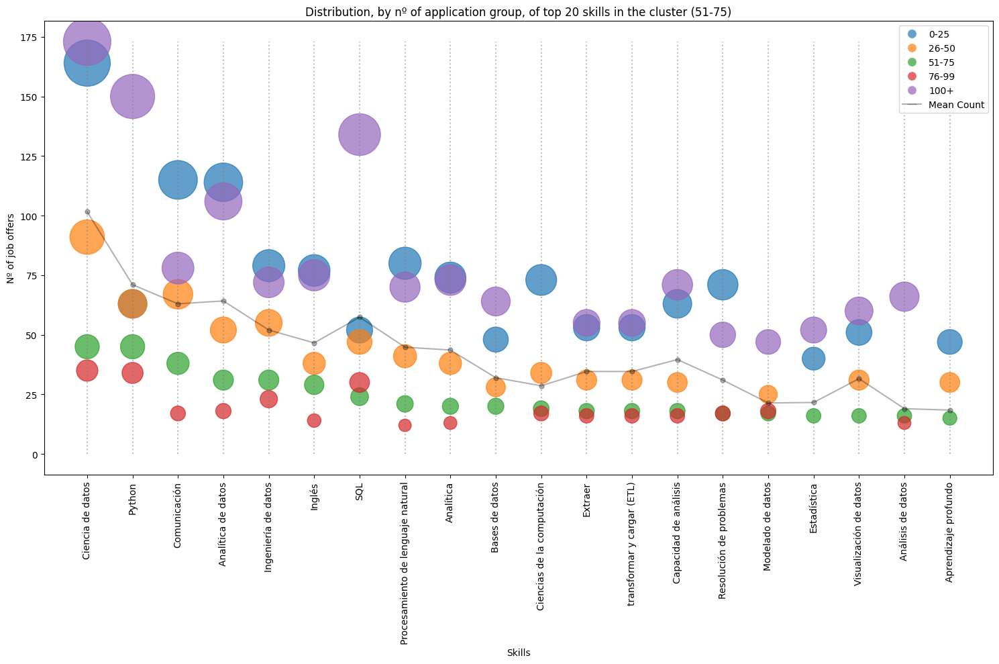

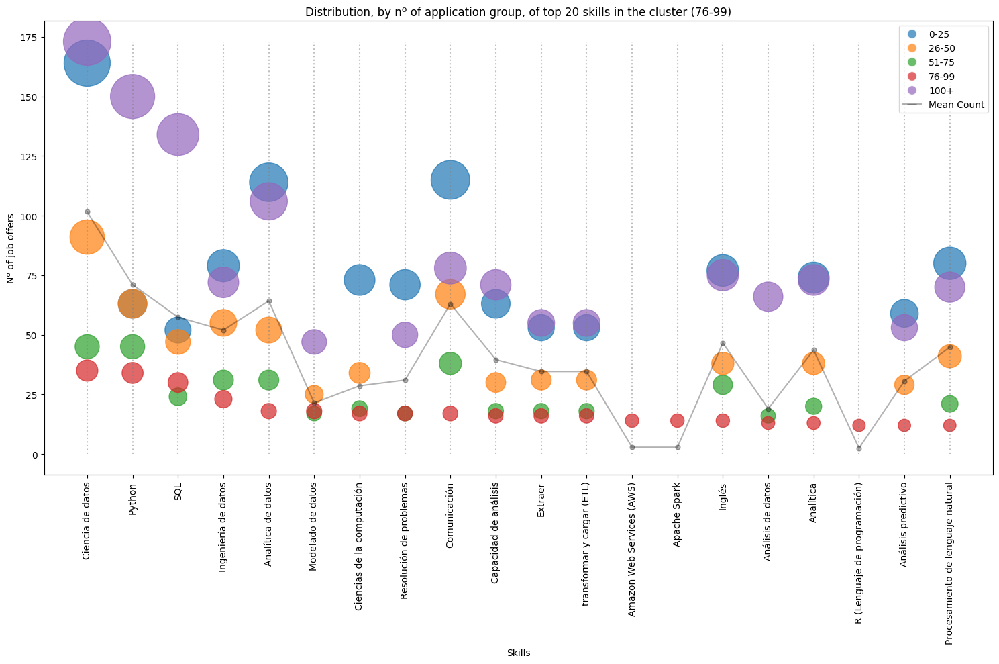

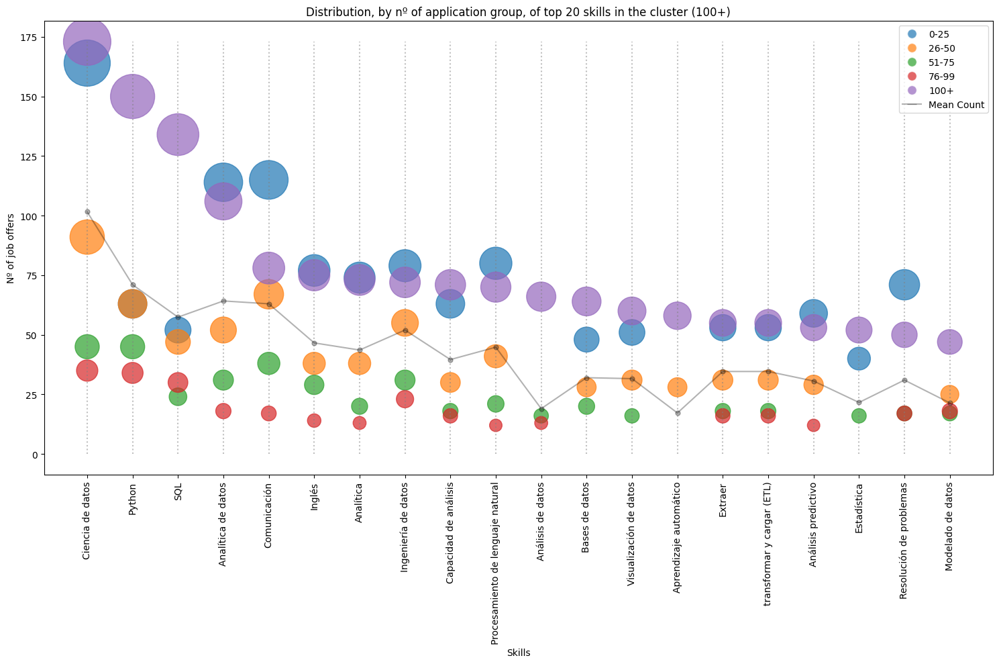

In [ ]:
for k in unique_skills.keys(): # Iterating over each cluster

    # Prepare for plotting
    grouped_jobs_df_plot = grouped_jobs_df.loc[:,unique_skills[k]].drop('Total') # Select the skills for the cluster and drop the 'Total' row
    skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
    colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
    plt.figure(figsize=(15, 10));legend_elements = [] # Config the size of the plot & Build a list to store the legend elements
    
    # Iterate over each group and draw a scatter plot for each one
    for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
        cluster_skills = data.values # Extract the skill counts for the group
        plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster]))  # Add a legend
    
    # Draw the line for the mean skill counts
    total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
    plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
    legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend
    
    # Add vertical lines at each point
    max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
    for i, count in enumerate(total_counts):
        plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)
    
    
    # Configure the plot
    plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
    plt.title(f'Distribution, by nº of application group, of top 20 skills in the cluster ({cluster_keyword_dict[k]})')
    plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot

## Grouping by responsibility

In [ ]:
# Define a function to extract the last element from a string separated by " || "
def extract_responsibility(text):
    # Split the text by " || " and return the last element
    return text.split(" || ")[-1]

In [ ]:
# Apply the function to create a new column 'responsibility'
jobs_['responsibility'] = jobs_['workType'].apply(extract_responsibility)

# Calculate the threshold count
threshold_count = sum(jobs_['responsibility'].value_counts())**(1/3)

# Get the value counts for each responsibility
responsibility_counts = jobs_['responsibility'].value_counts()

# Identify responsibilities with counts less than the threshold
other_responsibilities = responsibility_counts[responsibility_counts < threshold_count].index.tolist()

# Replace the responsibilities with counts less than the threshold with 'Other'
jobs_['responsibility'] = jobs_['responsibility'].apply(lambda x: 'Other' if x in other_responsibilities else x)

# Map the cluster numbers to the explanatory words
cluster_labels = list(jobs_['responsibility'].unique())
cluster_labels = [x for x in cluster_labels if str(x) != 'nan'] # delete 'nan'
cluster_keyword_dict = {
    cluster: jobs_[jobs_['responsibility'] == cluster]['responsibility'].iloc[0][:40] for cluster in cluster_labels
}

jobs_['responsibility'].value_counts()

responsibility
Intermedio                 701
Algo de responsabilidad    360
Jornada completa           248
Sin experiencia            173
Other                       34
Prácticas                   26
Director                    18
Name: count, dtype: int64

In [ ]:
# BUILD SKILLS BY CLUSTER DF TO ANALYZE THE SKILLS BY TYPE OF JOB

grouped_jobs = jobs_.groupby('responsibility') # Grouping by cluster labels

cluster_skills_counts = {} # Dict to store the counts of each skill by cluster

# Iterate over each group and count the frequency of each skill
for label, group in grouped_jobs:
    group['skillSet'] = group['skillSet'].astype(str) # Convert all values in the 'skillSet' column to strings
    all_skills = ' || '.join(group['skillSet'].values) # Concat all the skills into a single text
    all_skills_list = all_skills.split(' || ') # Split the text into a list of skills
    skill_counts = Counter(all_skills_list) # Count the frequency of each skill
    top_skills = dict(skill_counts.most_common(20)) # Get the 20 most common skills
    cluster_skills_counts[label] = top_skills # Add the counts to the dictionary

# Convert the dictionary to a DataFrame
grouped_jobs_df = pd.DataFrame(cluster_skills_counts).fillna(0).astype(int).T.reset_index()
grouped_jobs_df.rename(columns={'index': 'Cluster'}, inplace=True) # Rename the index column to 'Cluster'
grouped_jobs_df.set_index('Cluster', inplace=True) # Set the 'Cluster' column as the index
grouped_jobs_df.loc['Total'] = grouped_jobs_df.sum() # Add a row with the total frequency of skills for each cluster
grouped_jobs_df = grouped_jobs_df[grouped_jobs_df.sum().sort_values(ascending=False).index] # Sort the columns by total frequency (descending)

grouped_jobs_df_30 = grouped_jobs_df.iloc[:,:30]; grouped_jobs_df_30 # restrict the number of columns to the top 30 & display the DataFrame

,Ciencia de datos,Python,Analítica de datos,Comunicación,SQL,Ingeniería de datos,Inglés,Procesamiento de lenguaje natural,Analítica,Capacidad de análisis,...,Inteligencia artificial,Aprendizaje profundo,Estadística,Reconocimiento de patrones,R (Lenguaje de programación),Microsoft Azure,Amazon Web Services (AWS),Microsoft Power BI,Deportes,Recogida de datos
Cluster,,,,,,,,,,,,,,,,,,,,,
Algo de responsabilidad,75,96,41,60,86,40,73,28,39,40,...,0,0,0,0,0,25,25,24,0,0
Director,5,0,4,7,0,0,0,2,6,0,...,3,0,0,3,0,0,0,0,0,0
Intermedio,228,172,139,149,135,113,90,99,99,86,...,71,0,0,0,0,0,0,0,0,0
Jornada completa,120,48,79,53,32,63,25,52,39,37,...,0,35,0,25,0,0,0,0,0,0
Other,6,4,7,6,4,0,8,5,6,7,...,0,0,0,0,0,0,0,0,6,5
Prácticas,11,5,5,0,3,6,6,4,4,0,...,0,0,4,0,5,0,0,0,0,0
Sin experiencia,71,32,49,38,29,36,30,38,26,26,...,0,20,26,0,22,0,0,0,0,0
Total,516,357,324,313,289,258,232,228,219,196,...,74,55,30,28,27,25,25,24,6,5


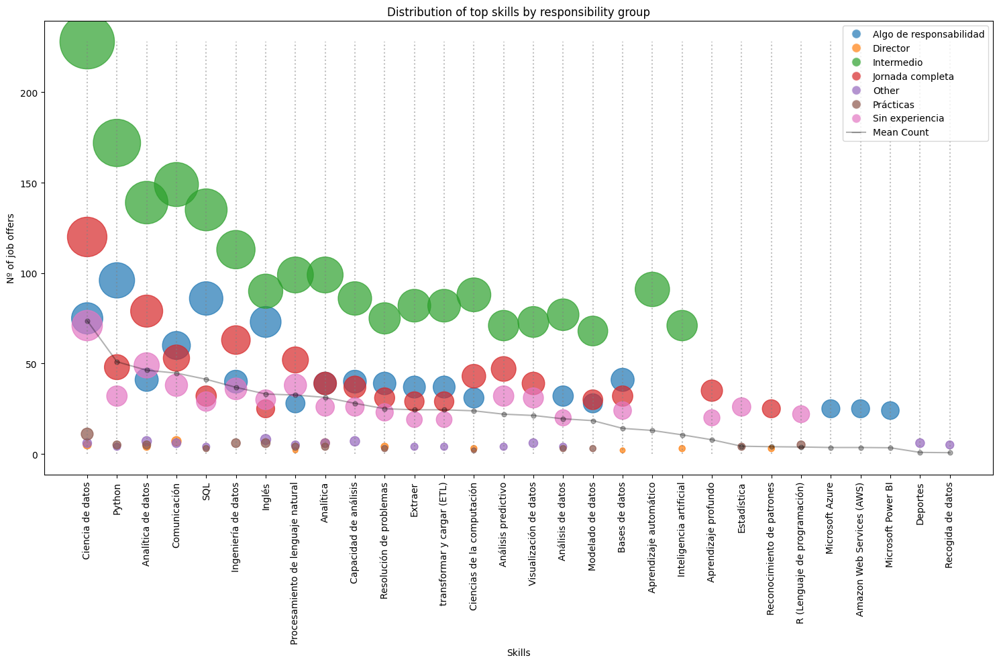

In [ ]:
# PLOT THE DISTRIBUTION OF TOP SKILLS BY JOB OFFER GROUP

# Prepare for plotting
grouped_jobs_df_plot = grouped_jobs_df_30.drop('Total') # Drop the 'Total' row
skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
plt.figure(figsize=(15, 10)); legend_elements = [] # Config the size of the plot & Build a list to store the legend elements

# Iterate over each group and draw a scatter plot for each one
for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
    cluster_skills = data.values # Extract the skill counts for the group
    plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
    legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster])) # Add a legend

# Draw the line for the mean skill counts
total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend

# Add vertical lines at each point
max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
for i, count in enumerate(total_counts):
    plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)

# Configure the plot
plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
plt.title('Distribution of top skills by responsibility group')
plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot

In [ ]:
# BUILD A DICT WITH THE TOP 20 SKILLS BY CLUSTER

unique_skills = {}
for cluster, skills_counts in cluster_skills_counts.items(): # Iterating over each cluster and its skills counts
    sills = []
    for skill in skills_counts.keys(): # Iterating over each skill in the cluster
           sills.append(skill)
    unique_skills[cluster] = sills

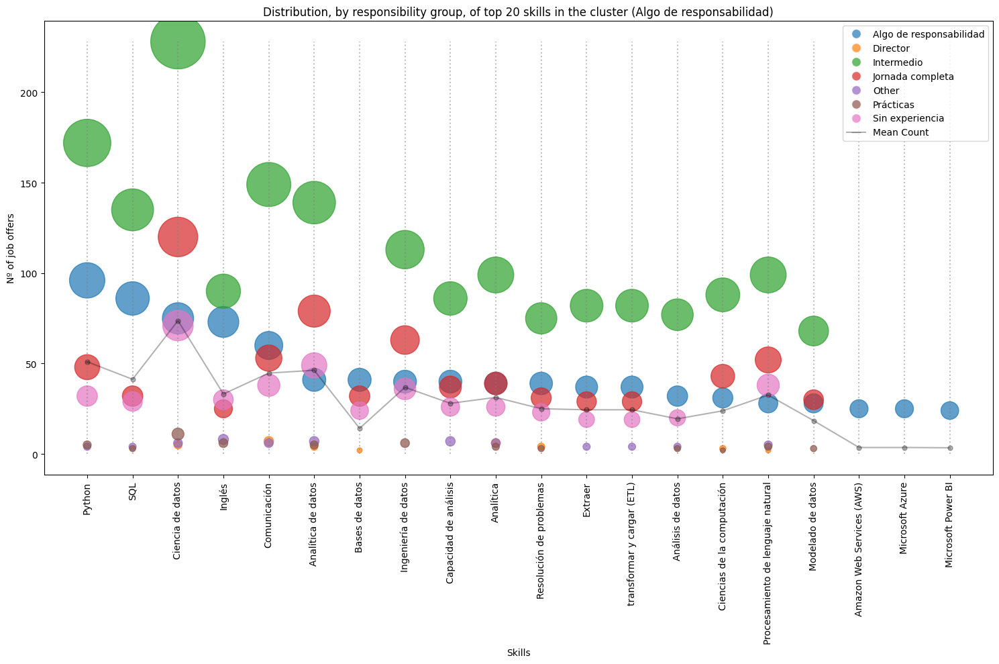

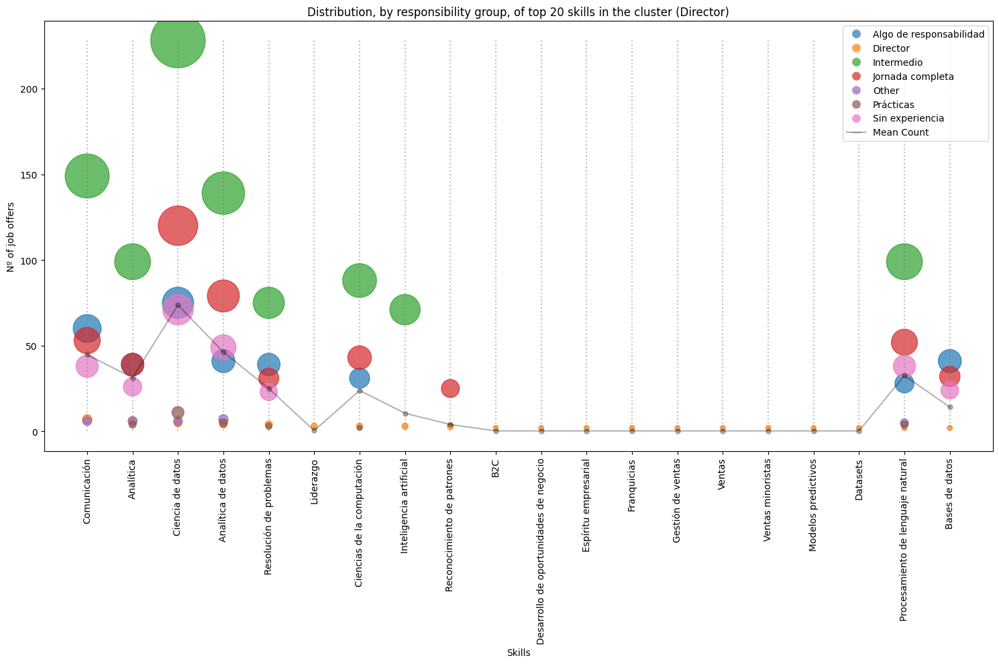

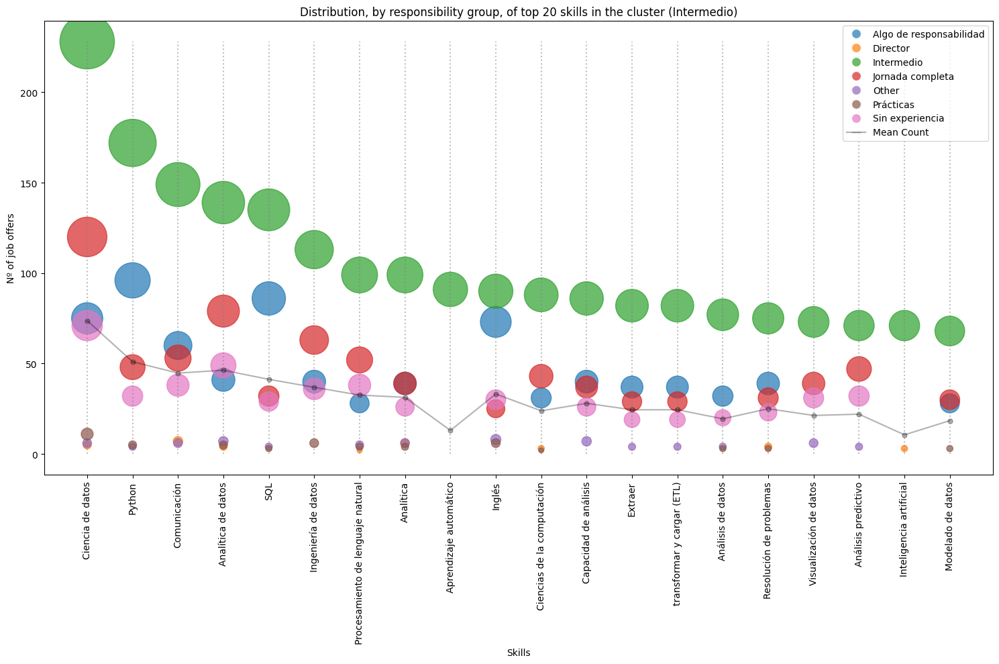

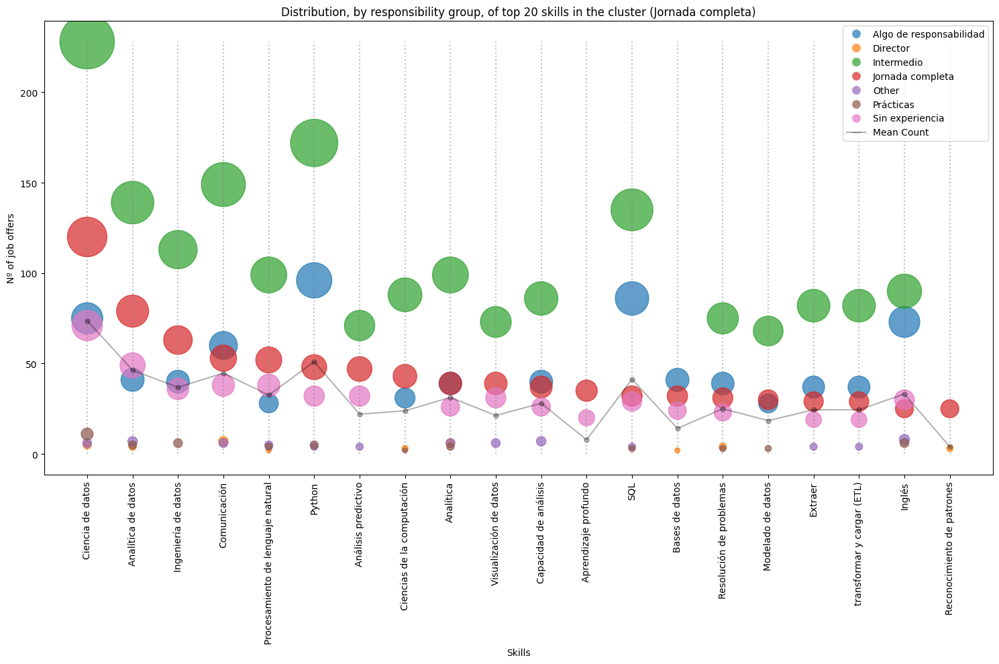

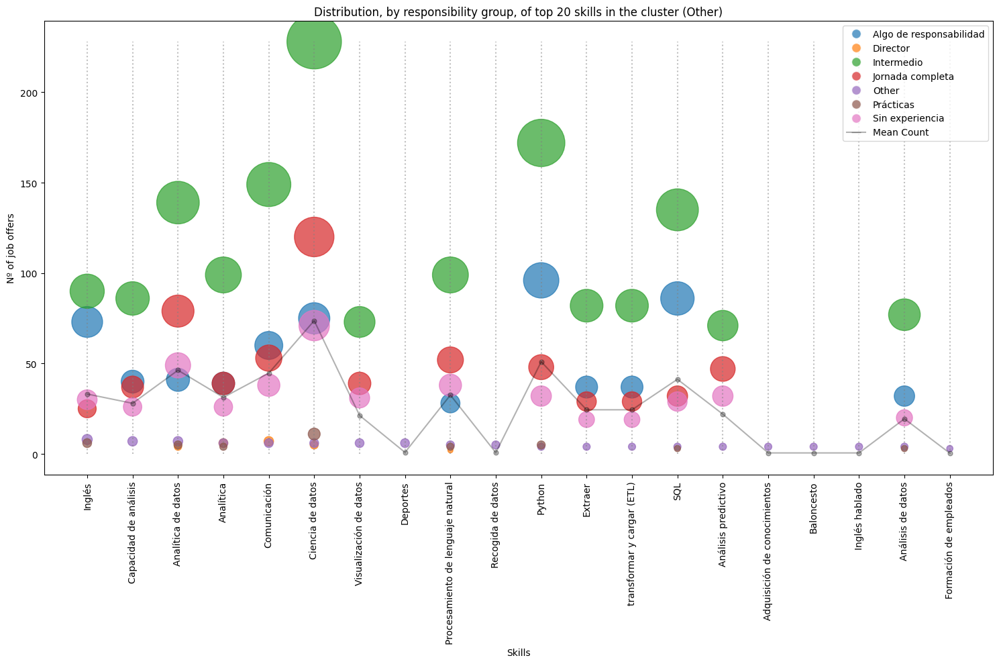

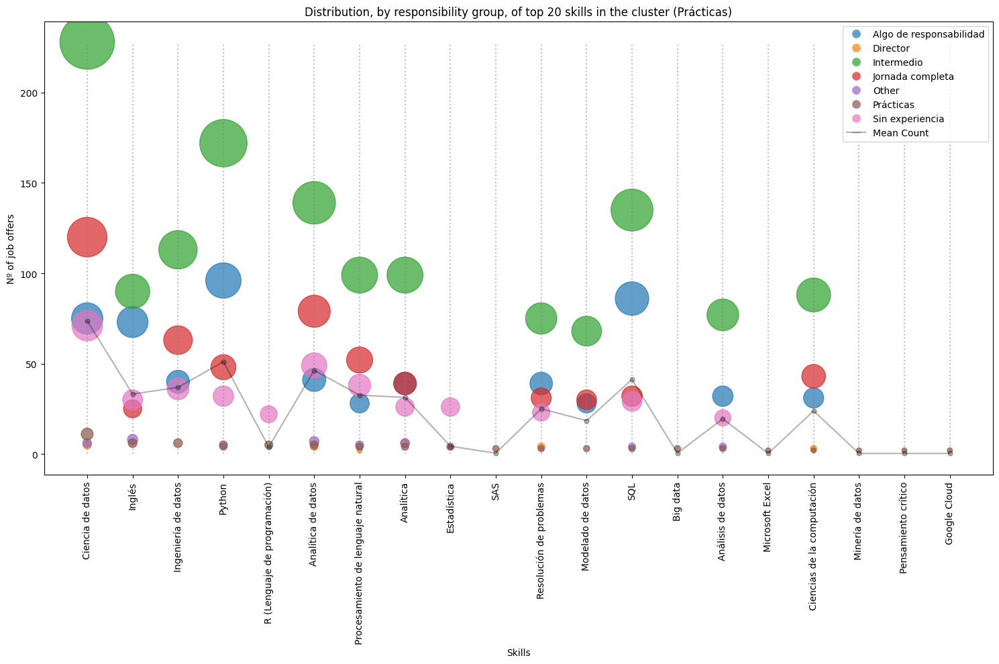

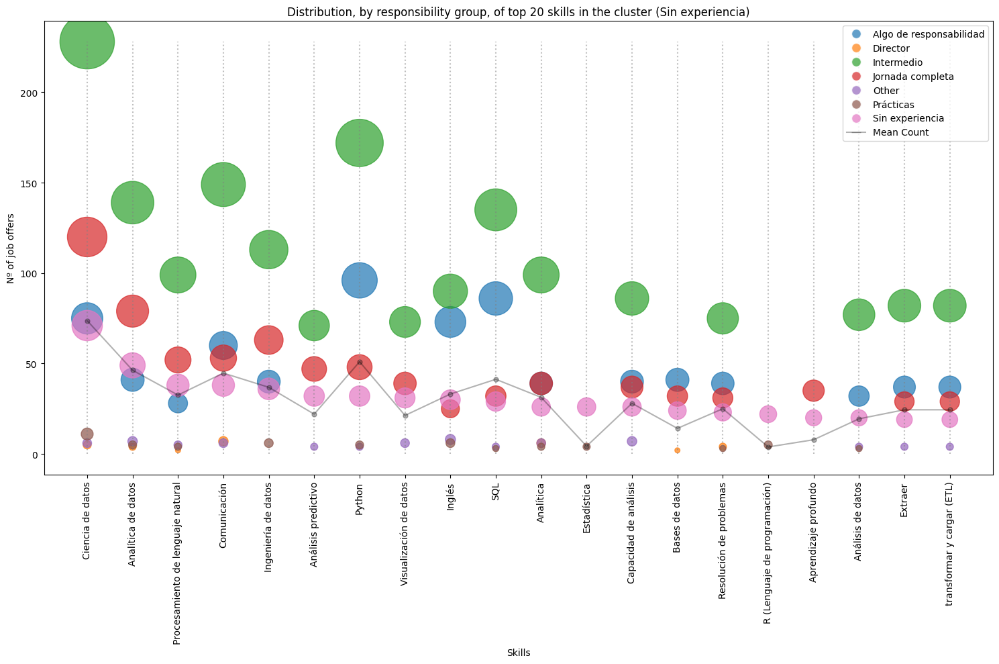

In [ ]:
for k in unique_skills.keys(): # Iterating over each cluster

    # Prepare for plotting
    grouped_jobs_df_plot = grouped_jobs_df.loc[:,unique_skills[k]].drop('Total') # Select the skills for the cluster and drop the 'Total' row
    skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
    colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
    plt.figure(figsize=(15, 10));legend_elements = [] # Config the size of the plot & Build a list to store the legend elements
    
    # Iterate over each group and draw a scatter plot for each one
    for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
        cluster_skills = data.values # Extract the skill counts for the group
        plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster]))  # Add a legend
    
    # Draw the line for the mean skill counts
    total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
    plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
    legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend
    
    # Add vertical lines at each point
    max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
    for i, count in enumerate(total_counts):
        plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)
    
    
    # Configure the plot
    plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
    plt.title(f'Distribution, by responsibility group, of top 20 skills in the cluster ({cluster_keyword_dict[k]})')
    plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot

## Grouping by employees

In [ ]:
# Split the 'location' column into 'enterprise', 'place', 'howLong' & 'applications' columns 
jobs_[['employees', 'sector']] = jobs_['companyDetails'].str.split(' · ', expand=True)

# replace 'Más de ' by '+'
jobs_['employees'] = jobs_['employees'].str.replace('Más de ', '+')
jobs_['employees'] = jobs_['employees'].str.replace('De ', '')
jobs_['employees'] = jobs_['employees'].str.replace(' a ', '-')

# Calculate the threshold count
threshold_count = sum(jobs_['employees'].value_counts())**(1/3)

# Get the value counts for each employees
employee_counts = jobs_['employees'].value_counts()

# Identify responsibilities with counts less than the threshold
other_employee = employee_counts[employee_counts < threshold_count].index.tolist()

# Replace the responsibilities with counts less than the threshold with 'Other'
jobs_['employees'] = jobs_['employees'].apply(lambda x: 'Other' if x in other_employee else x)
employee_counts = jobs_['employees'].value_counts()

# Map the cluster numbers to the explanatory words
cluster_labels = list(jobs_['employees'].unique())
cluster_labels = [x for x in cluster_labels if str(x) != 'nan'] # delete 'nan'
cluster_keyword_dict = {
    cluster: jobs_[jobs_['employees'] == cluster]['employees'].iloc[0][:40] for cluster in cluster_labels
}

jobs_['employees'].value_counts()

employees
+10,001 empleados         433
1.001-5.000 empleados     374
51-200 empleados          190
201-500 empleados         165
501-1.000 empleados       142
11-50 empleados           109
5.001-10.000 empleados     91
Entre 1 y 10 empleados     44
Other                      12
Name: count, dtype: int64

In [ ]:
# BUILD SKILLS BY CLUSTER DF TO ANALYZE THE SKILLS BY TYPE OF JOB

grouped_jobs = jobs_.groupby('employees') # Grouping by cluster labels

cluster_skills_counts = {} # Dict to store the counts of each skill by cluster

# Iterate over each group and count the frequency of each skill
for label, group in grouped_jobs:
    group['skillSet'] = group['skillSet'].astype(str) # Convert all values in the 'skillSet' column to strings
    all_skills = ' || '.join(group['skillSet'].values) # Concat all the skills into a single text
    all_skills_list = all_skills.split(' || ') # Split the text into a list of skills
    skill_counts = Counter(all_skills_list) # Count the frequency of each skill
    top_skills = dict(skill_counts.most_common(20)) # Get the 20 most common skills
    cluster_skills_counts[label] = top_skills # Add the counts to the dictionary

# Convert the dictionary to a DataFrame
grouped_jobs_df = pd.DataFrame(cluster_skills_counts).fillna(0).astype(int).T.reset_index()
grouped_jobs_df.rename(columns={'index': 'Cluster'}, inplace=True) # Rename the index column to 'Cluster'
grouped_jobs_df.set_index('Cluster', inplace=True) # Set the 'Cluster' column as the index
grouped_jobs_df.loc['Total'] = grouped_jobs_df.sum() # Add a row with the total frequency of skills for each cluster
grouped_jobs_df = grouped_jobs_df[grouped_jobs_df.sum().sort_values(ascending=False).index] # Sort the columns by total frequency (descending)

# Drop the 'Other' row if the count is less than 30
if "Other" in employee_counts:
    if employee_counts["Other"] < 30:
        grouped_jobs_df.drop("Other", inplace=True)

grouped_jobs_df_30 = grouped_jobs_df.iloc[:,:30]; grouped_jobs_df_30 # restrict the number of columns to the top 30 & display the DataFrame

,Ciencia de datos,Python,Analítica de datos,Comunicación,SQL,Ingeniería de datos,Procesamiento de lenguaje natural,Inglés,Analítica,Capacidad de análisis,...,Inteligencia artificial,Aprendizaje profundo,Estadística,Big data,Microsoft Azure,Matemáticas,R (Lenguaje de programación),Scala,Modelos predictivos,Reconocimiento de patrones
Cluster,,,,,,,,,,,,,,,,,,,,,
"+10,001 empleados",138,75,100,99,47,81,56,73,77,65,...,36,34,0,0,0,0,0,0,0,0
1.001-5.000 empleados,111,87,67,70,88,45,43,70,39,0,...,0,0,40,0,31,0,0,0,0,0
11-50 empleados,45,23,35,21,15,16,27,0,23,16,...,13,18,0,0,0,0,0,0,7,12
201-500 empleados,57,44,25,31,41,32,23,21,0,16,...,17,17,0,16,0,0,0,0,0,0
5.001-10.000 empleados,29,15,21,23,22,19,11,9,13,15,...,9,0,23,13,0,13,0,0,0,0
501-1.000 empleados,52,42,36,34,28,33,34,16,25,20,...,15,17,0,0,0,0,16,16,0,0
51-200 empleados,60,57,31,32,36,28,28,34,23,31,...,0,0,0,18,0,18,0,0,0,0
Entre 1 y 10 empleados,17,13,9,4,11,7,6,4,5,5,...,7,3,0,0,0,0,0,0,5,0
Total,516,357,324,315,289,262,228,227,205,168,...,97,89,63,47,31,31,16,16,12,12


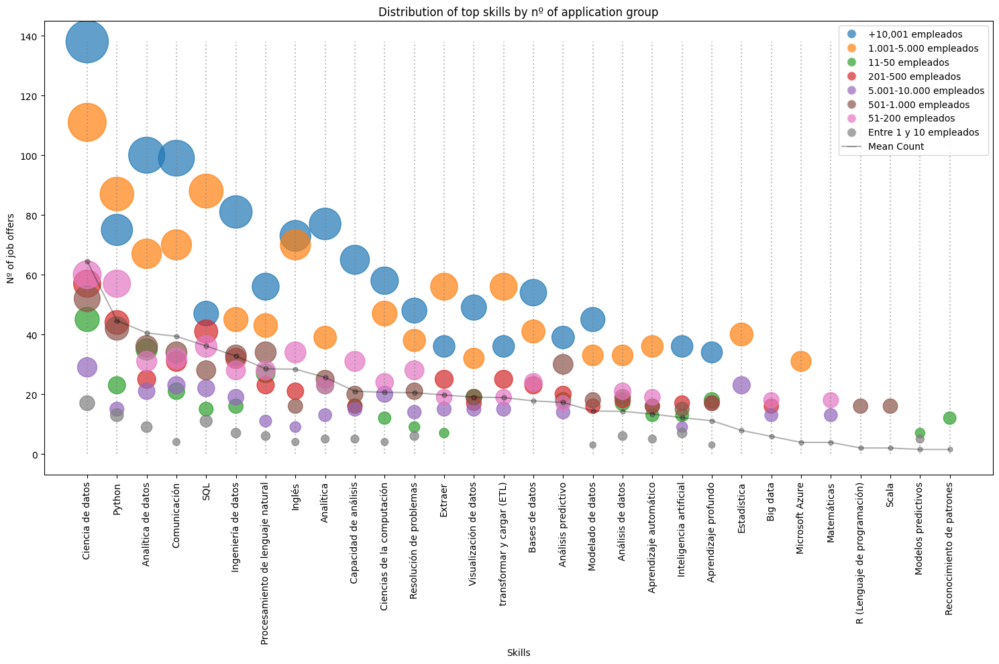

In [ ]:
# PLOT THE DISTRIBUTION OF TOP SKILLS BY JOB OFFER GROUP

# Prepare for plotting
grouped_jobs_df_plot = grouped_jobs_df_30.drop('Total') # Drop the 'Total' row
skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
plt.figure(figsize=(15, 10)); legend_elements = [] # Config the size of the plot & Build a list to store the legend elements

# Iterate over each group and draw a scatter plot for each one
for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
    cluster_skills = data.values # Extract the skill counts for the group
    plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
    legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster])) # Add a legend

# Draw the line for the mean skill counts
total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend

# Add vertical lines at each point
max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
for i, count in enumerate(total_counts):
    plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)

# Configure the plot
plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
plt.title('Distribution of top skills by nº of application group')
plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot

In [ ]:
# BUILD A DICT WITH THE TOP 20 SKILLS BY CLUSTER

unique_skills = {}
for cluster, skills_counts in cluster_skills_counts.items(): # Iterating over each cluster and its skills counts
    sills = []
    for skill in skills_counts.keys(): # Iterating over each skill in the cluster
           sills.append(skill)
    unique_skills[cluster] = sills

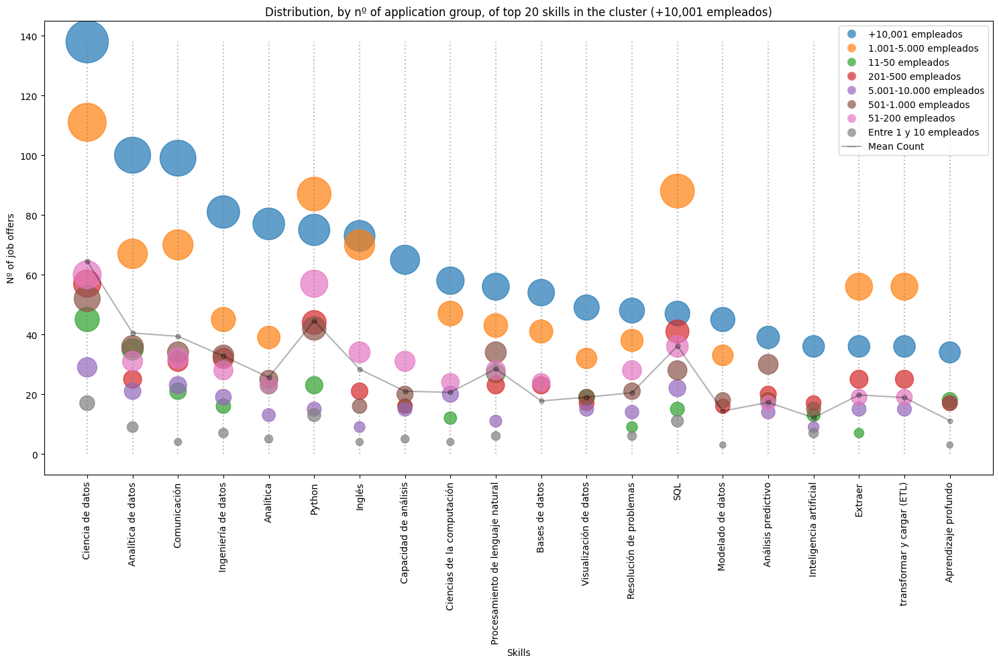

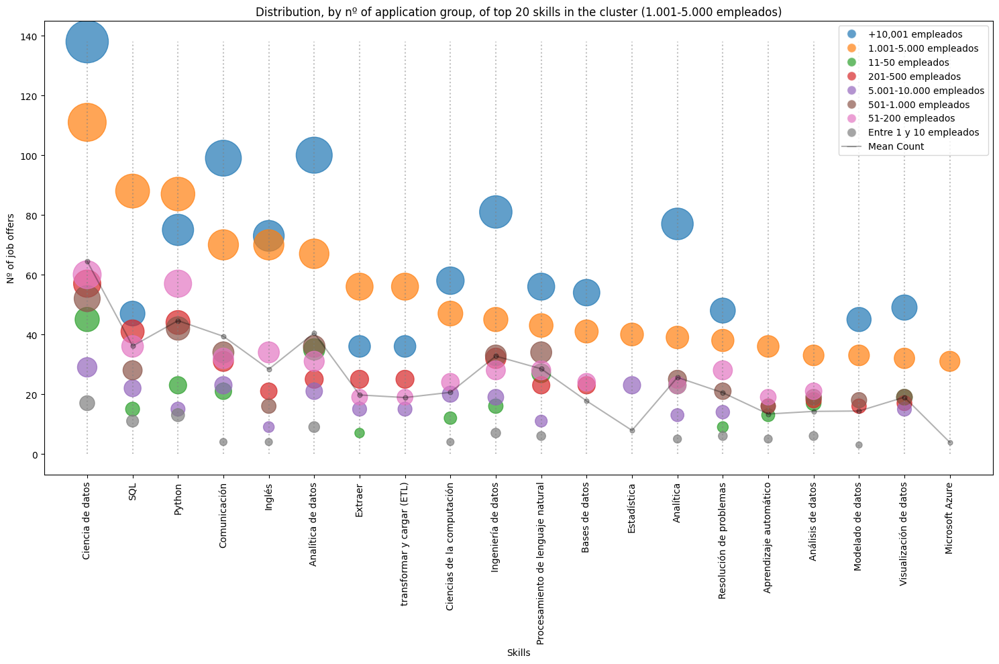

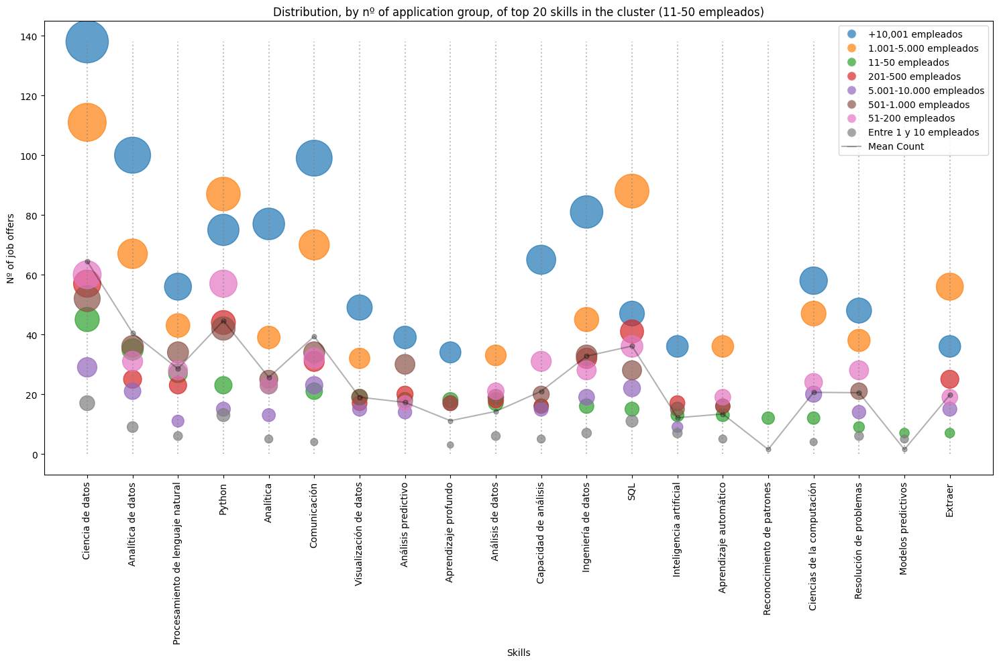

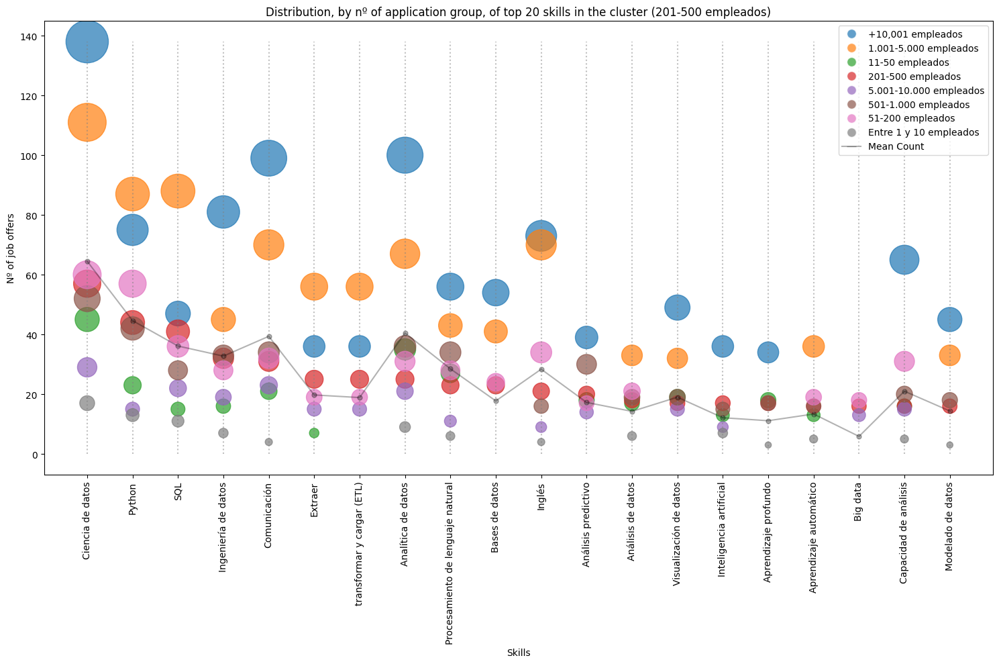

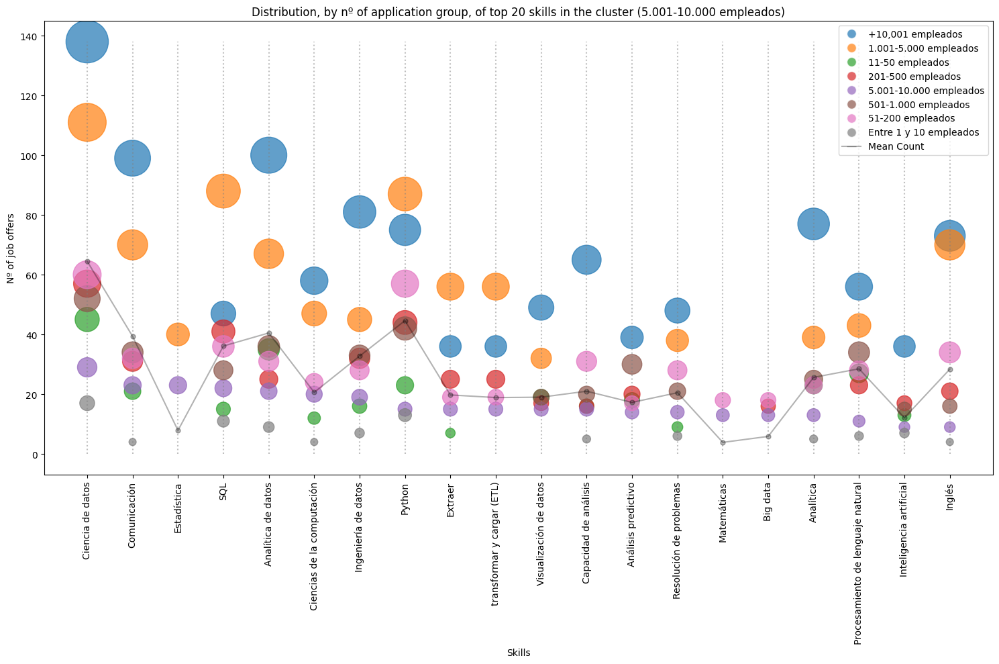

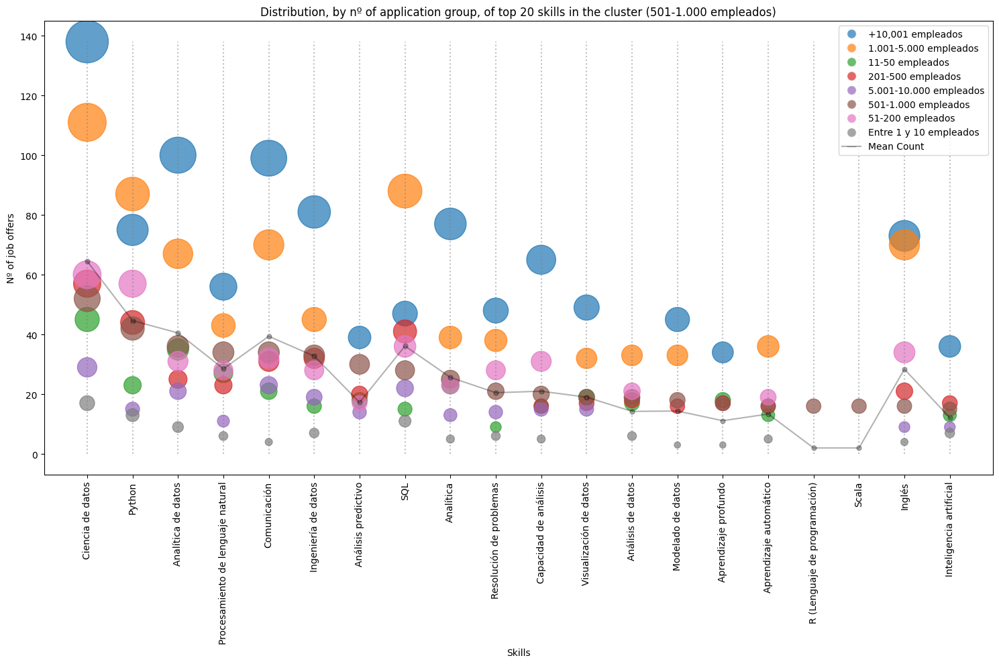

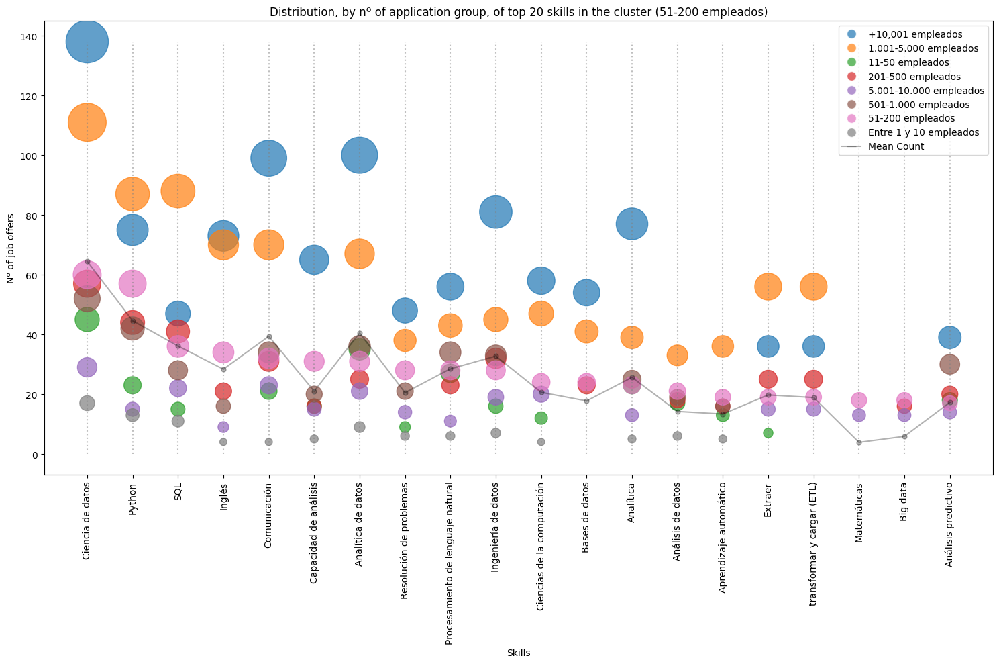

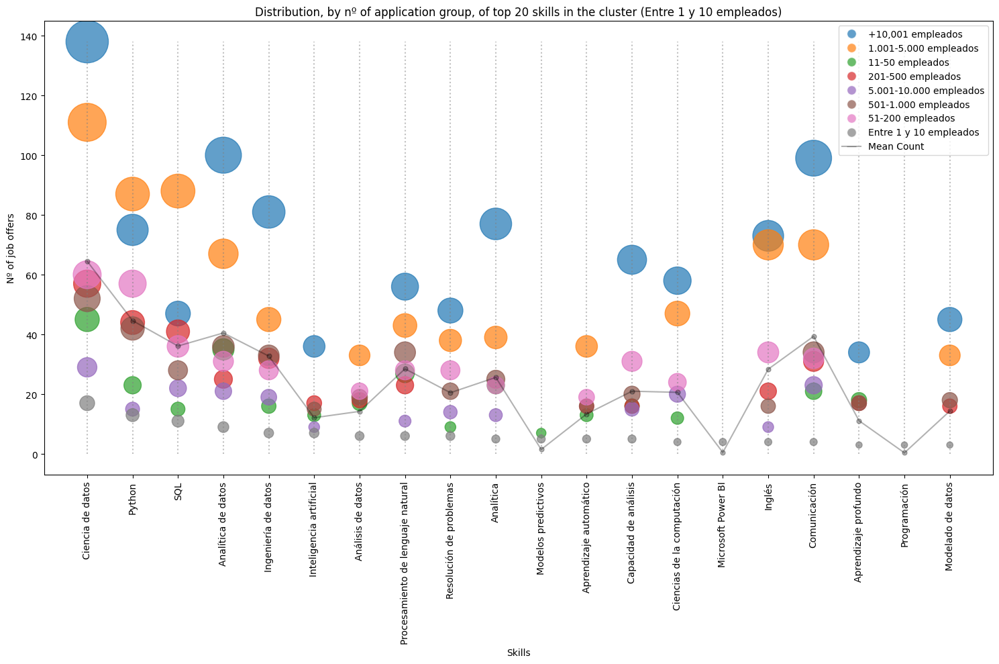

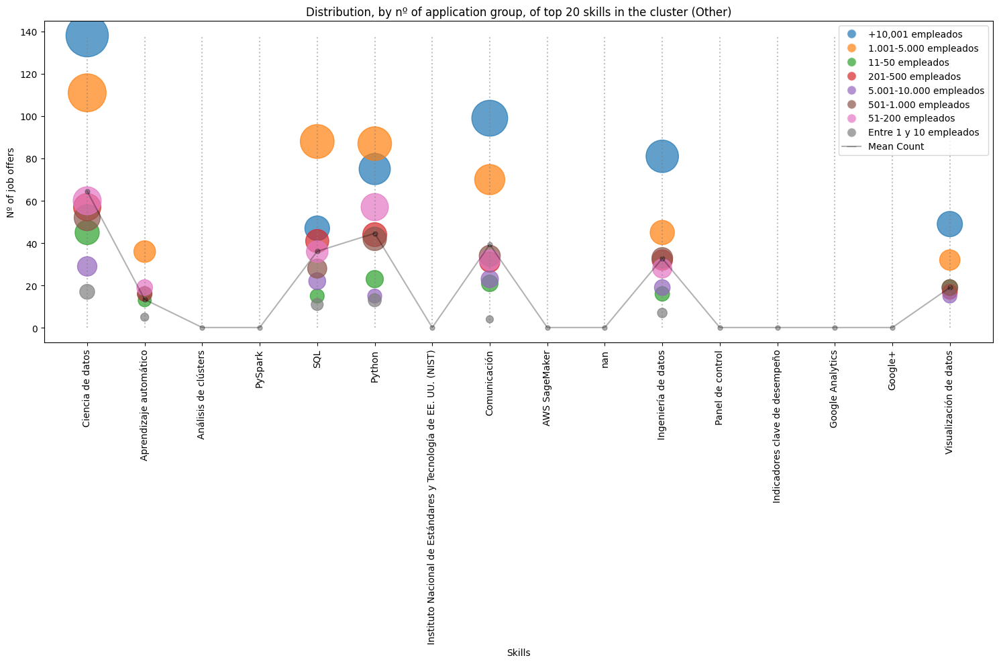

In [ ]:
for k in unique_skills.keys(): # Iterating over each cluster

    # Prepare for plotting
    grouped_jobs_df_plot = grouped_jobs_df.loc[:,unique_skills[k]].drop('Total') # Select the skills for the cluster and drop the 'Total' row
    skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
    colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
    plt.figure(figsize=(15, 10));legend_elements = [] # Config the size of the plot & Build a list to store the legend elements
    
    # Iterate over each group and draw a scatter plot for each one
    for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
        cluster_skills = data.values # Extract the skill counts for the group
        plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster]))  # Add a legend
    
    # Draw the line for the mean skill counts
    total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
    plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
    legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend
    
    # Add vertical lines at each point
    max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
    for i, count in enumerate(total_counts):
        plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)
    
    
    # Configure the plot
    plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
    plt.title(f'Distribution, by nº of application group, of top 20 skills in the cluster ({cluster_keyword_dict[k]})')
    plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot

## Grouping y sector

### Adequate Data

In [ ]:
# Replace 'nan' values with 'Other'
jobs_['sector'] = jobs_['sector'].fillna('None')

# Apply the function to the "job_position" column and create a new column "clean_tokens"
jobs_['sector_tokens'] = jobs_['sector'].apply(clean_and_tokenize)

# delete "servicios" from the tokens
jobs_['sector_tokens'] = jobs_['sector_tokens'].apply(lambda x: [word for word in x if word not in ['servicios', 'empresas']])

# Filter 'howLong' column and get the word list
jobs_['sector_tokens'], wordList = filter_words_by_frequency(jobs_['sector_tokens'])

In [ ]:
# Calculate TF-IDF for grouping by job position with KMeans
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(jobs_['sector_tokens'])
tfidf_matrix_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out()) # tfidf_matrix as dataframe

### Find best K & hiperparameters

In [ ]:
# FIND BEST K WITH GAP STATISTICS

k_max = min(15, max(5,round(len(wordList)**(1/2.25)))) # Define max number of clusters
k_min = min(10, max(2,round(len(wordList)**(1/5)))) # Define min number of clusters

# Call the function to find the optimal k with gap statistics
optimal_ks_gap_statistics = find_optimal_k_gap_statistics(tfidf_matrix_df, max_clusters=k_max, num_iterations=15, num_splits=5, k_min=k_min)
k_importances_gap=optimal_ks_gap_statistics[1]

# Print k_min, k_max, k_dict and k_importances_gap
print("k_min: ", k_min); print("k_max: ", k_max); print("k dict: ", optimal_ks_gap_statistics[0]); print("k importances gap: ", optimal_ks_gap_statistics[1])

c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\clus

k_min:  3
k_max:  9
k dict:  {9: 0.754906673803317, 8: 0.7492400149900991, 2: 0.7440406845869114, 7: 0.6973691540303133, 6: 0.6816875648014382, 5: 0.6527333133930769, 4: 0.6076038456844052, 3: 0.5674762009485032}
k importances gap:  {9: 0.16024283313678436, 8: 0.15903998052710383, 7: 0.14802943577252684, 6: 0.14470072988963656, 5: 0.13855465721862004, 4: 0.12897509723518727, 3: 0.12045726622014101}


c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\clus

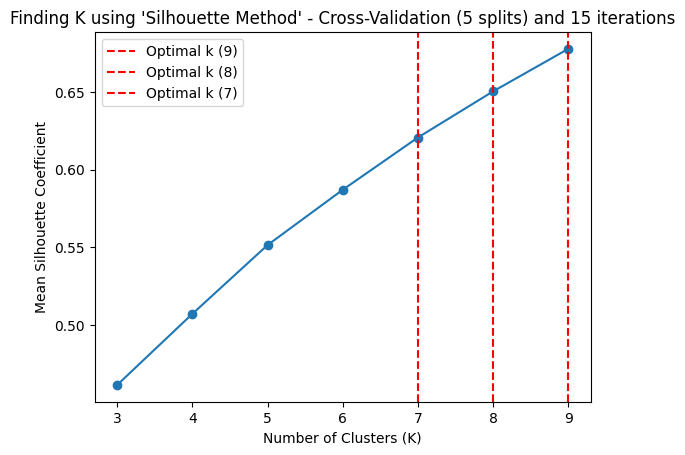

Top 3 optimal number of clusters (k): [9, 8, 7]


In [ ]:
# SILHOUETTE METHOD WITH CROSS-VALIDATION (K-FOLD) AND MULTIPLE ITERATIONS

num_iterations = 15; num_splits = 5; silhouette_scores = [] # Define the nº iterations, nº splits in CV & List to store the results of silhouette scores

# Loop over each iteration
for iteration in range(num_iterations):
    silhouette_scores_iteration = [] # Scores of each K & split [for this iteration]
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration) # CV object for this iteration
    
    # Loop over each split
    for train_index, _ in kf.split(tfidf_matrix_df):
        X_train = tfidf_matrix_df.iloc[train_index] # Training data for this split
        silhouette_k = [] # Scores of each K [for this split]

        # Loop over each K
        for k in range(k_min, k_max + 1):
            kmeans = KMeans(n_clusters=k, random_state=iteration)
            labels = kmeans.fit_predict(X_train)
            score = silhouette_score(X_train, labels)
            silhouette_k.append(score)
        
        silhouette_scores_iteration.append(silhouette_k) # Store the silhuette results of each K, each split [for this iteration]
    silhouette_scores.extend(silhouette_scores_iteration) # Extend will add each element of that list separately to the end of the original list [not list of list]
silhouette_mean = np.mean(silhouette_scores, axis=0) # Calculate mean silhouette scores for each k across all iterations and splits

# Dict with k as key and mean_score_k as value
k_list = range(k_min, k_max + 1)
k_dict = {k_list[i]: silhouette_mean[i] for i in range(len(k_list))}
k_dict = dict(sorted(k_dict.items(), key=lambda item: item[1], reverse=True))
k_importances_sil = {k: v/sum(k_dict.values()) for k, v in k_dict.items()}

# Plot the silhouette coefficient curve
plt.plot(range(k_min, k_max + 1), silhouette_mean, marker='o')
plt.xlabel('Number of Clusters (K)'); plt.ylabel('Mean Silhouette Coefficient')
plt.title(f"Finding K using 'Silhouette Method' - Cross-Validation ({num_splits} splits) and {num_iterations} iterations")

for k_value in list(k_dict.keys())[0:3]: # Add a vertical line for the top 3 optimal number of clusters
    plt.axvline(x=k_value, color='r', linestyle='--', label=f'Optimal k ({k_value})')

plt.legend(); plt.show(); print(f'Top 3 optimal number of clusters (k): {list(k_dict.keys())[0:3]}') # Show results

c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\clus

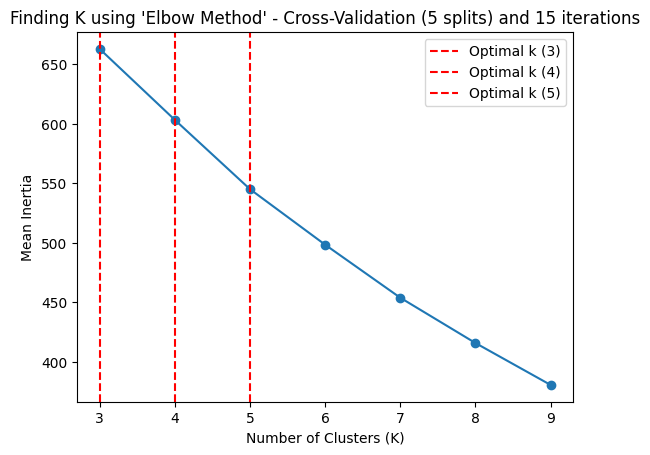

Top 3 optimal number of clusters (k): [3, 4, 5]


In [ ]:
# ELBOW METHOD WITH CROSS-VALIDATION (K-FOLD) AND MULTIPLE ITERATIONS

num_iterations = 15; num_splits = 5; inertia_iterations = [] # Define the nº iterations, nº splits in CV & List to store the results of inertia scores

# Loop over each iteration
for iteration in range(num_iterations):
    inertia_iteration = [] 
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)

    # Loop over each split
    for train_index, _ in kf.split(tfidf_matrix_df):
        X_train = tfidf_matrix_df.iloc[train_index]
        inertia_k = []
        
        # Loop over each K
        for k in range(k_min, k_max + 1):
            kmeans = KMeans(n_clusters=k, random_state=iteration)
            kmeans.n_clusters = k # Actualize the number of clusters in the KMeans object
            kmeans.fit(X_train) # Fit the KMeans object with the training data
            inertia_k.append(kmeans.inertia_) # Store the inertia of each K [for this split]
        
        inertia_iteration.append(inertia_k) # Store the inertia results of each K, each split [for this iteration]
    inertia_iterations.extend(inertia_iteration) # Store the inertia results of each K, each split, each iteration
inertia_mean = np.mean(inertia_iterations, axis=0) # Calculate mean silhouette scores for each k across all iterations and splits

# Dict with k as key and mean_score_k as value
k_list = range(k_min, k_max + 1)
k_dict = {k_list[i]: inertia_mean[i] for i in range(len(k_list))}
k_dict = dict(sorted(k_dict.items(), key=lambda item: item[1], reverse=True))
k_importances_elbow = {k: v/sum(k_dict.values()) for k, v in k_dict.items()} # Dict with k as key and importance as value

# Plot the silhouette coefficient curve
plt.plot(range(k_min, k_max + 1), inertia_mean, marker='o')
plt.xlabel('Number of Clusters (K)'); plt.ylabel('Mean Inertia')
plt.title(f"Finding K using 'Elbow Method' - Cross-Validation ({num_splits} splits) and {num_iterations} iterations")

for k_value in list(k_dict.keys())[0:3]:# Add a vertical line for the top 3 optimal number of clusters
    plt.axvline(x=k_value, color='r', linestyle='--', label=f'Optimal k ({k_value})')

plt.legend(); plt.show(); print(f'Top 3 optimal number of clusters (k): {list(k_dict.keys())[0:3]}') # Show results

In [ ]:
# COMBINE THE IMPORTANCES OF THE THREE METHODS

k_importances = {}
for key in k_importances_gap.keys(): # Iterate over the keys of one of the dictionaries
    # Sum the corresponding values of the 3 dictionaries and store them on k_importances
    k_importances[key] = k_importances_gap[key] + k_importances_sil[key] + k_importances_elbow[key]

# Sort the dictionary by value in descending order
k_importances = dict(sorted(k_importances.items(), key=lambda item: item[1], reverse=True)); print(k_importances)

{8: 0.43619540086646147, 9: 0.4342581260744838, 6: 0.42944208732980715, 7: 0.42855225136925756, 5: 0.42763041783984235, 4: 0.4234913468080994, 3: 0.4204303697120483}


In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],  # Range of k based on the optimal k
    'init': ['k-means++', 'random'],
    'copy_x': [True, False],
    'algorithm': ['elkan', 'lloyd'],
    'random_state': [43]
}

num_iterations = 15; num_splits = 5; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\xavie\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\clus

Overall Best Parameters: {'algorithm': 'elkan', 'copy_x': True, 'init': 'k-means++', 'n_clusters': 9, 'random_state': 43}
Overall Best Score: -92.07287240989334


In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid Based on previous Overall Best Parameters
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],
    'init': [overall_best_params['init']],
    'n_init': [10, 50, 100],
    'copy_x': [overall_best_params['copy_x']],
    'algorithm': ['elkan', 'lloyd'],
    'random_state': [43]
}

num_iterations = 5; num_splits = 3; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

Overall Best Parameters: {'algorithm': 'lloyd', 'copy_x': True, 'init': 'k-means++', 'n_clusters': 9, 'n_init': 50, 'random_state': 43}
Overall Best Score: -154.35905504919018


In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid based on previous Overall Best Parameters
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],
    'init': [overall_best_params['init']],
    'n_init': [max(10,overall_best_params['n_init']-20), overall_best_params['n_init'], min(150,overall_best_params['n_init']+20)],
    'copy_x': [overall_best_params['copy_x']],
    'algorithm': [overall_best_params['algorithm']],
    'random_state': [43]
}

num_iterations = 5; num_splits = 3; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

Overall Best Parameters: {'algorithm': 'lloyd', 'copy_x': True, 'init': 'k-means++', 'n_clusters': 9, 'n_init': 30, 'random_state': 43}
Overall Best Score: -154.28737989462968


In [ ]:
# FINDING BEST HIPERPARAMETERS

# Define param grid based on previous Overall Best Parameters
param_grid = {
    'n_clusters': list(k_importances.keys())[0:3],
    'init': [overall_best_params['init']],
    'n_init': [overall_best_params['n_init'], 150, 'auto'],
    'copy_x': [overall_best_params['copy_x']],
    'algorithm': [overall_best_params['algorithm']],
    'random_state': [43]
}

num_iterations = 5; num_splits = 3; grid_search_params = []; grid_search_results = [] # Nº of iterations and splits & Lists to store best param combination and score

for iteration in range(num_iterations):
    kf = KFold(n_splits=num_splits, shuffle=True, random_state=iteration)
    grid_search = GridSearchCV(estimator=KMeans(), param_grid=param_grid, cv=kf)
    grid_search.fit(tfidf_matrix_df)
    grid_search_params.append(grid_search.best_params_); grid_search_results.append(grid_search.best_score_)

# Obtain the overall best parameters and the overall best score
overall_best_params = grid_search_params[np.argmax(grid_search_results)]
overall_best_score = np.max(grid_search_results)

print("Overall Best Parameters:", overall_best_params); print("Overall Best Score:", overall_best_score)

Overall Best Parameters: {'algorithm': 'lloyd', 'copy_x': True, 'init': 'k-means++', 'n_clusters': 9, 'n_init': 30, 'random_state': 43}
Overall Best Score: -154.28737989462968


### Fit K-Means & Define groups

sector_clusterLabels
1    572
5    433
0    122
8    113
3     85
2     85
7     56
4     49
6     45
Name: count, dtype: int64

Inertia: 458.6399727122966

N_iter: 5


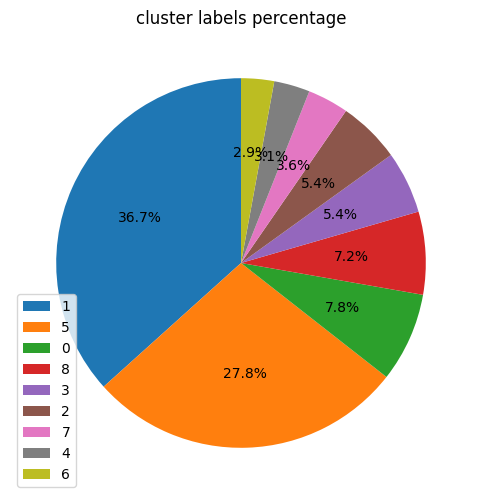

In [ ]:
# FIT K-MEANS

# Use the best parameters found
best_kmeans_params = {
    'n_clusters': overall_best_params['n_clusters'],
    'init': overall_best_params['init'],
    'n_init': overall_best_params['n_init'],
    'copy_x': overall_best_params['copy_x'],
    'algorithm': overall_best_params['algorithm'],
    'random_state': 4 #3
}

# Fit the KMeans, adjust it to the data & obtain the labels
best_kmeans = KMeans(**best_kmeans_params); best_kmeans.fit(tfidf_matrix_df); position_clusterLabels = best_kmeans.labels_

# Add the cluster labels to the dataframe
tfidf_matrix_df_['sector_clusterLabels'] = position_clusterLabels; jobs_['sector_clusterLabels'] = position_clusterLabels

# Obtain the number of samples for each cluster
position_clusterLabels=tfidf_matrix_df_['sector_clusterLabels'].value_counts(); print(position_clusterLabels)

# Obtain the centroids of the clusters, the inertia & the number of iterations required to converge
centroids = best_kmeans.cluster_centers_; inertia = best_kmeans.inertia_; n_iter = best_kmeans.n_iter_
print("\nInertia:",inertia); print("\nN_iter:",n_iter)

# Plot pie 
cluster_labels_plot=position_clusterLabels.plot(kind='pie', autopct='%1.1f%%', startangle=90, legend=True, fontsize=10, labels=None, title='cluster labels percentage',figsize=(6,6))
plt.ylabel(''); plt.show()

In [ ]:
# DEFINING HEACH CLUSTER BY THE MOST COMMON KEYWORD/S

# Group by cluster_labels and count the frequency of each token
cluster_keywords = jobs_.groupby('sector_clusterLabels')['sector_tokens'].value_counts()

# Define a function to get the keyword with the highest count of values for each cluster
def get_most_common_keyword(row):
    cluster_label = row['sector_clusterLabels']
    cluster_keywords_counts = cluster_keywords.get(cluster_label)
    if cluster_keywords_counts is None: # If there are no keywords for the cluster, return None
        return None
    most_common_keyword = cluster_keywords_counts.index[0]
    if most_common_keyword == '': # If the most common kw is an empty string, take the second most common
        if len(cluster_keywords_counts) > 1:
            most_common_keyword = cluster_keywords_counts.index[1]
        else:
            most_common_keyword = None  # Si no hay una segunda palabra clave, devuelve None
    return most_common_keyword

# Apply the function to each row of the DataFrame and add the results as a new column
jobs_['sector_mostCommonKeyword'] = jobs_.apply(get_most_common_keyword, axis=1)

# Map the cluster numbers to the explanatory words
cluster_labels = jobs_['sector_clusterLabels'].unique()
cluster_keyword_dict = {
    cluster: jobs_[jobs_['sector_clusterLabels'] == cluster]['sector_mostCommonKeyword'].iloc[0][:40] for cluster in cluster_labels
}

cluster_keyword = jobs_.groupby('sector_clusterLabels')['sector_mostCommonKeyword'].value_counts(); cluster_keyword

sector_clusterLabels  sector_mostCommonKeyword       
0                     desarrollo software                122
1                     consultoría                        572
2                     dotación selección personal         85
3                     none                                85
4                     investigación                       49
5                     seguros                            433
6                     recursos humanos                    45
7                     financieros                         56
8                     tecnología información internet    113
Name: count, dtype: int64

### Visualizations

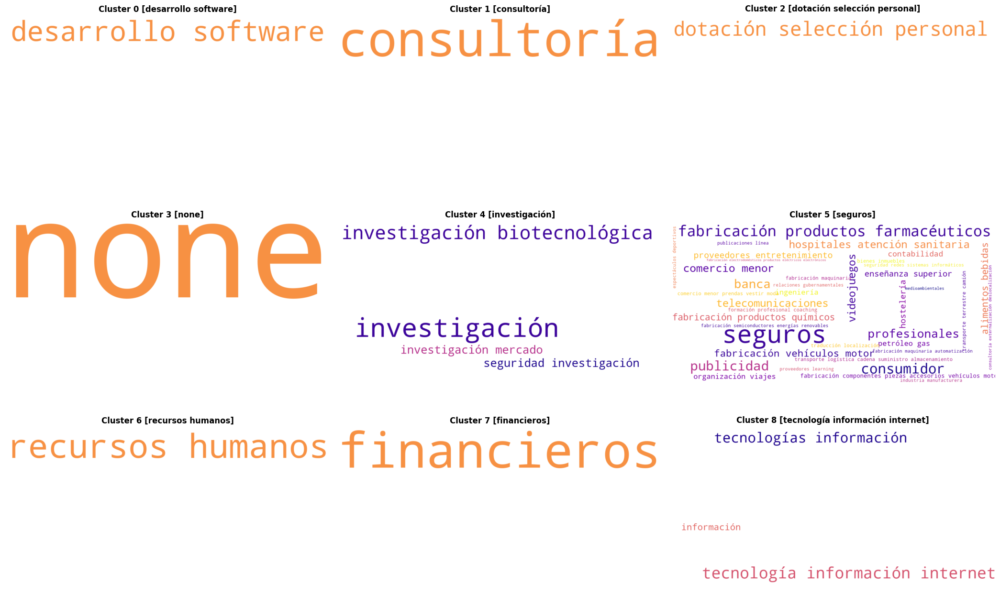

In [ ]:
# BUILD WORD CLOUDS FOR EACH CLUSTER BASED ON THE MOST COMMON KEYWORDS

# Find the total number of rows and columns to organize the subplots (Limitar el número de columnas a 3)
num_clusters = overall_best_params['n_clusters']; num_rows = int(np.ceil(num_clusters / 3)); num_cols = min(num_clusters, 3)

# Configure the size of the plot based on the number of rows and columns
plt.figure(figsize=(7 * num_cols, 4.5 * num_rows))

# Iterate over each group and create a word cloud for each one
for cluster, keywords in cluster_keywords.groupby(level=0):
    wordcloud_dict = {str(k[1]): v for k, v in keywords.items()} # Convert the Series object to a Python dictionary, taking only the keyword and its frequency

    # Create the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', prefer_horizontal=0.7, max_words=40, colormap='plasma', ranks_only=True, scale=1.5, font_step=2, random_state=42).generate_from_frequencies(wordcloud_dict)
    
    # Show the word cloud for the current group
    plt.subplot(num_rows, num_cols, cluster + 1); plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Cluster {cluster} [{cluster_keyword_dict[cluster]}]', fontweight='bold'); plt.axis('off')

plt.tight_layout(); plt.show() # Show the plot

In [ ]:
# BUILD SKILLS BY CLUSTER DF TO ANALYZE THE SKILLS BY TYPE OF JOB

grouped_jobs = jobs_.groupby('sector_clusterLabels') # Grouping by cluster labels

cluster_skills_counts = {} # Dict to store the counts of each skill by cluster

# Iterate over each group and count the frequency of each skill
for label, group in grouped_jobs:
    group['skillSet'] = group['skillSet'].astype(str) # Convert all values in the 'skillSet' column to strings
    all_skills = ' || '.join(group['skillSet'].values) # Concat all the skills into a single text
    all_skills_list = all_skills.split(' || ') # Split the text into a list of skills
    skill_counts = Counter(all_skills_list) # Count the frequency of each skill
    top_skills = dict(skill_counts.most_common(20)) # Get the 20 most common skills
    cluster_skills_counts[label] = top_skills # Add the counts to the dictionary

# Convert the dictionary to a DataFrame
grouped_jobs_df = pd.DataFrame(cluster_skills_counts).fillna(0).astype(int).T.reset_index()
grouped_jobs_df.rename(columns={'index': 'Cluster'}, inplace=True) # Rename the index column to 'Cluster'
grouped_jobs_df.set_index('Cluster', inplace=True) # Set the 'Cluster' column as the index
grouped_jobs_df.loc['Total'] = grouped_jobs_df.sum() # Add a row with the total frequency of skills for each cluster
grouped_jobs_df = grouped_jobs_df[grouped_jobs_df.sum().sort_values(ascending=False).index] # Sort the columns by total frequency (descending)

grouped_jobs_df_30 = grouped_jobs_df.iloc[:,:30]; grouped_jobs_df_30 # restrict the number of columns to the top 30 & display the DataFrame

,Ciencia de datos,Python,Analítica de datos,Comunicación,SQL,Ingeniería de datos,Procesamiento de lenguaje natural,Inglés,Analítica,Capacidad de análisis,...,Aprendizaje automático,Microsoft Azure,Aprendizaje profundo,Estadística,Reconocimiento de patrones,Matemáticas,Big data,Análisis de datos estadísticos,Scala,Investigación
Cluster,,,,,,,,,,,,,,,,,,,,,
0,52,20,19,44,13,21,21,13,15,16,...,17,0,14,17,19,18,14,0,12,0
1,174,162,108,79,116,101,78,99,71,65,...,0,58,0,0,0,0,0,0,0,0
2,38,22,25,11,19,24,25,0,15,16,...,0,0,18,11,0,0,0,12,0,0
3,23,11,0,10,10,7,6,5,6,13,...,5,0,0,0,0,0,0,0,0,6
4,11,11,0,8,0,7,5,9,0,0,...,5,0,0,0,0,0,4,0,0,5
5,129,81,103,115,69,65,51,75,78,55,...,34,0,0,0,0,0,0,0,0,0
6,18,9,17,5,12,12,13,8,14,7,...,0,0,10,4,0,0,0,6,0,0
7,20,13,13,18,20,9,11,0,0,13,...,6,0,0,12,0,11,0,0,0,0
8,51,28,30,25,28,16,18,12,14,12,...,17,0,11,0,19,0,0,0,0,0


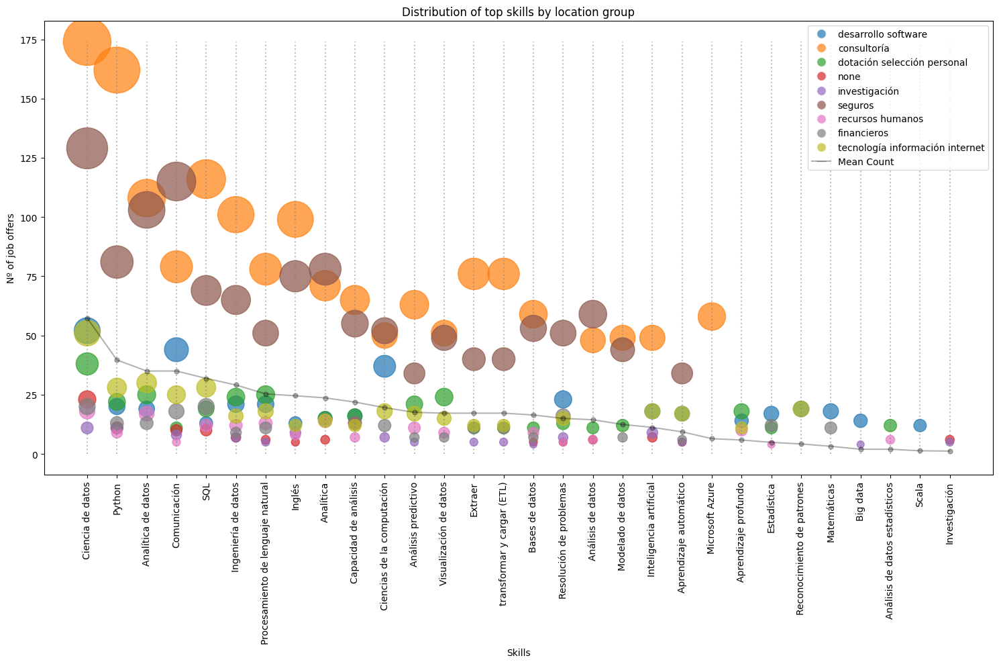

In [ ]:
# PLOT THE DISTRIBUTION OF TOP SKILLS BY JOB OFFER GROUP

# Prepare for plotting
grouped_jobs_df_plot = grouped_jobs_df_30.drop('Total') # Drop the 'Total' row
skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
plt.figure(figsize=(15, 10)); legend_elements = [] # Config the size of the plot & Build a list to store the legend elements

# Iterate over each group and draw a scatter plot for each one
for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
    cluster_skills = data.values # Extract the skill counts for the group
    plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
    legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster])) # Add a legend

# Draw the line for the mean skill counts
total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend

# Add vertical lines at each point
max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
for i, count in enumerate(total_counts):
    plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)

# Configure the plot
plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
plt.title('Distribution of top skills by location group')
plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot

In [ ]:
# BUILD A DICT WITH THE TOP 20 SKILLS BY CLUSTER

unique_skills = {}
for cluster, skills_counts in cluster_skills_counts.items(): # Iterating over each cluster and its skills counts
    sills = []
    for skill in skills_counts.keys(): # Iterating over each skill in the cluster
           sills.append(skill)
    unique_skills[cluster] = sills

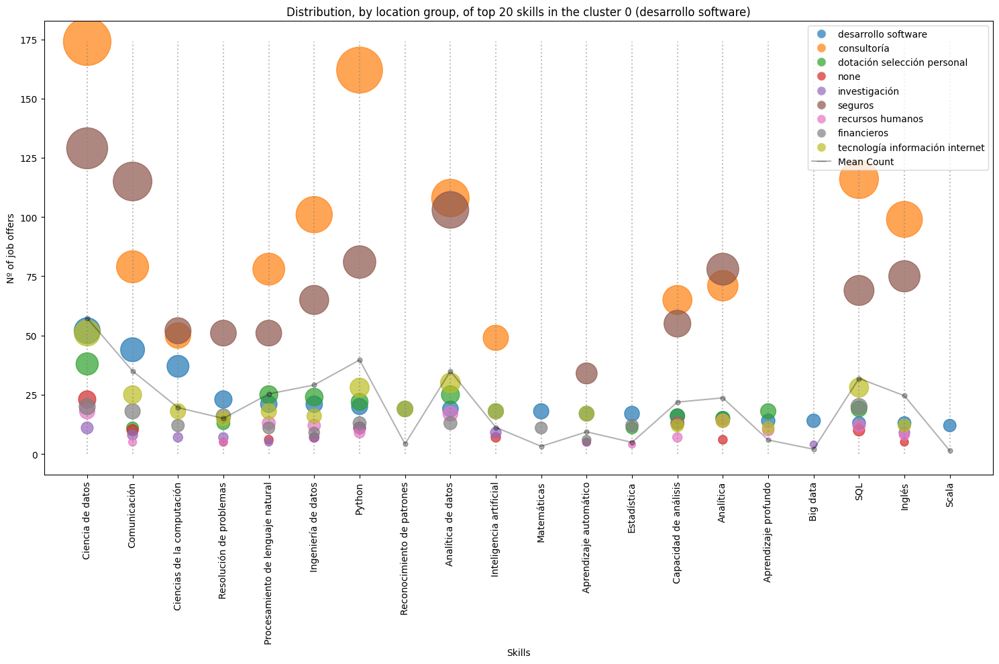

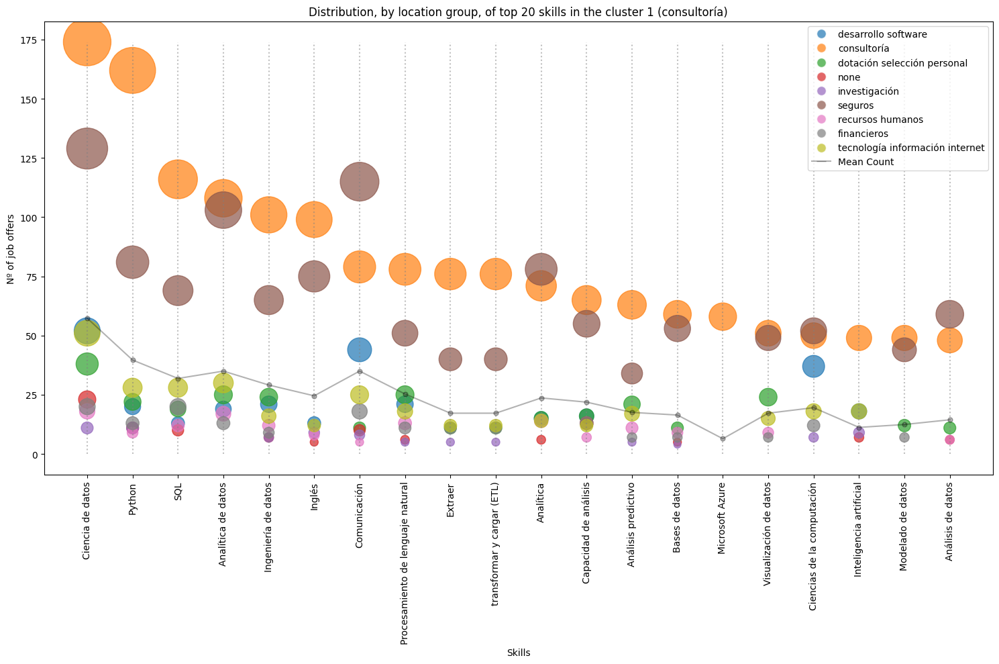

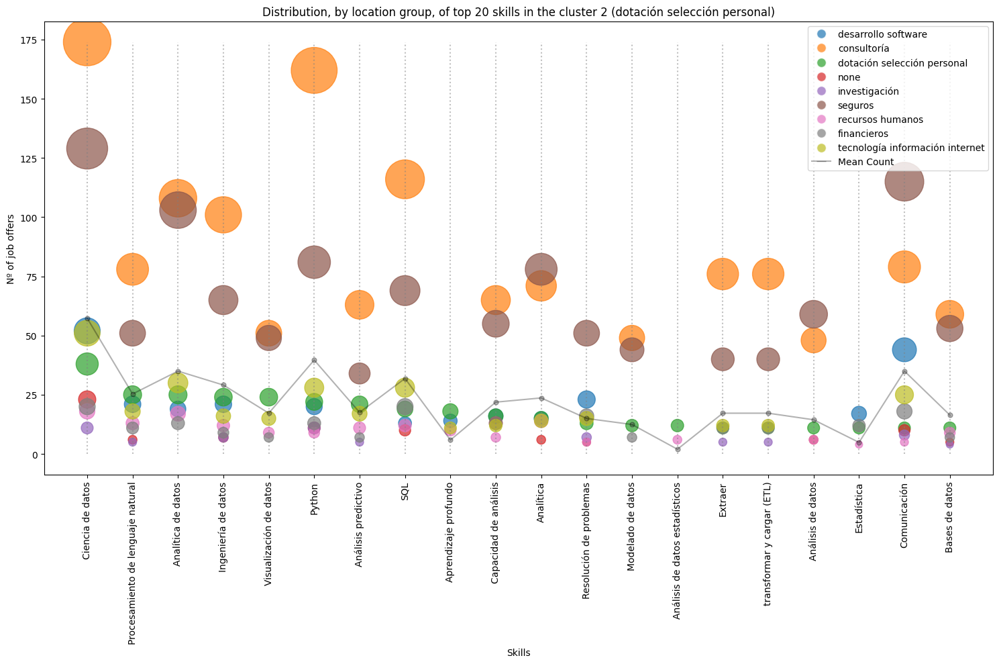

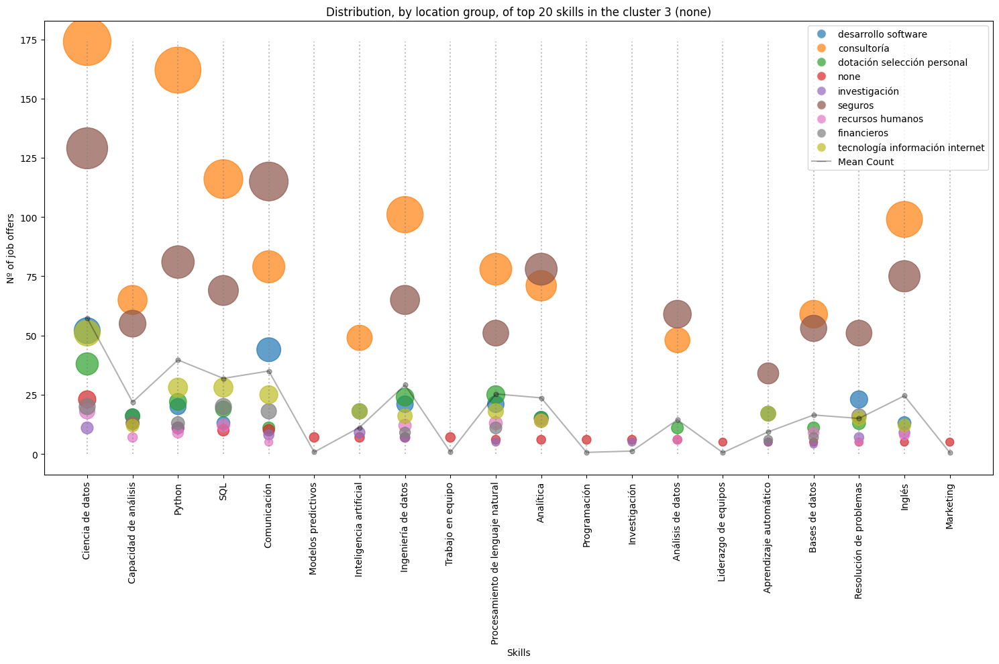

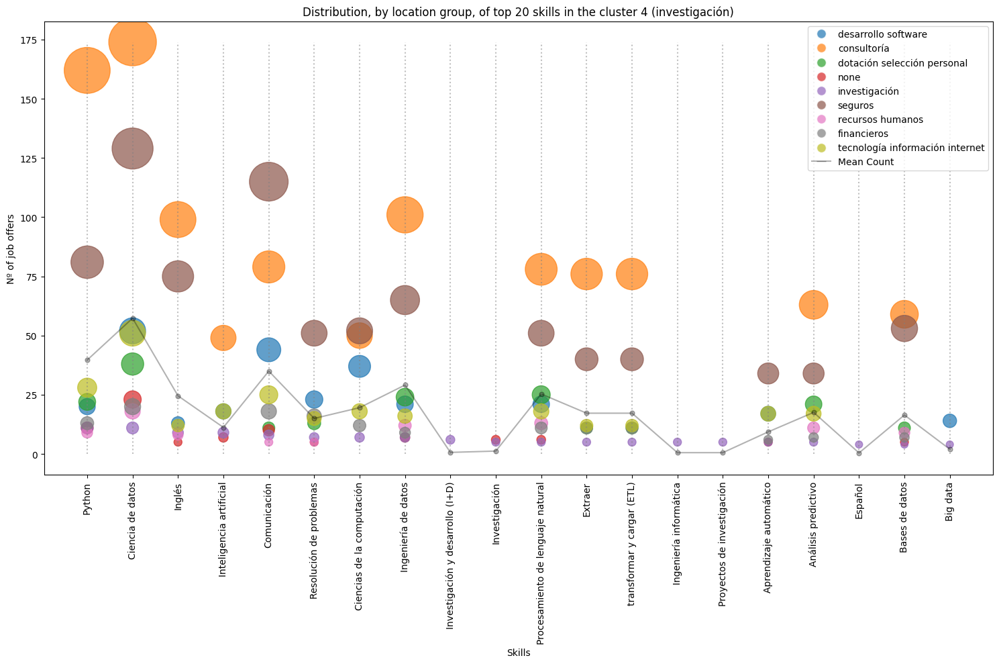

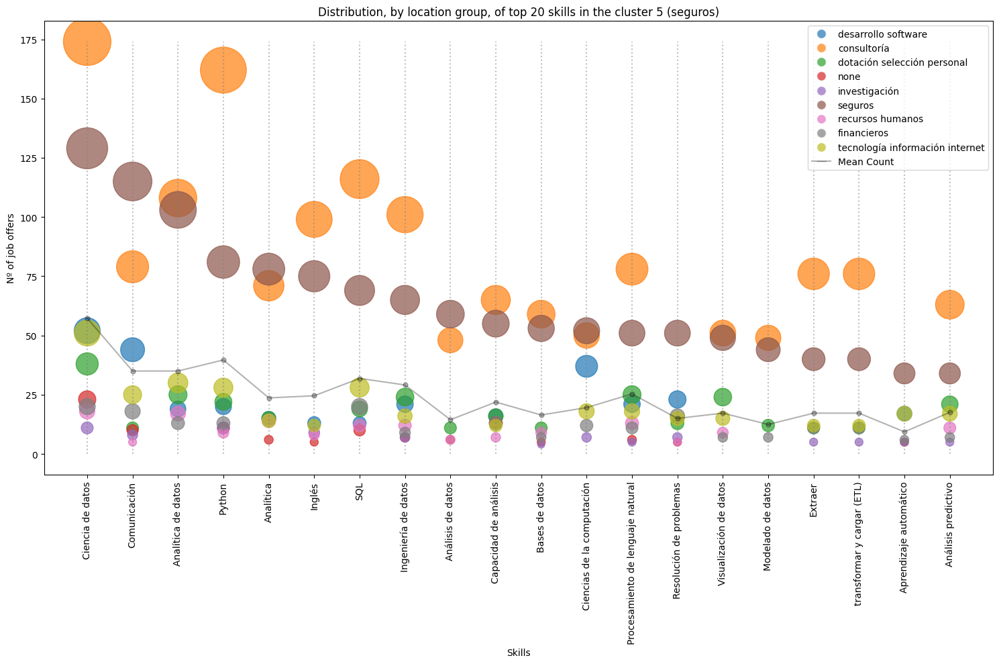

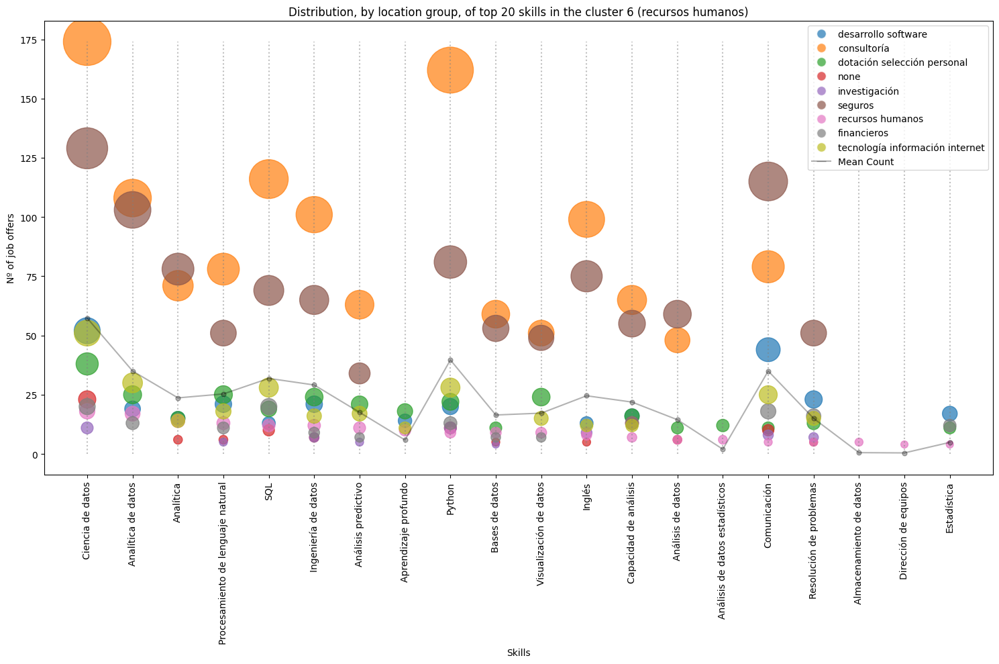

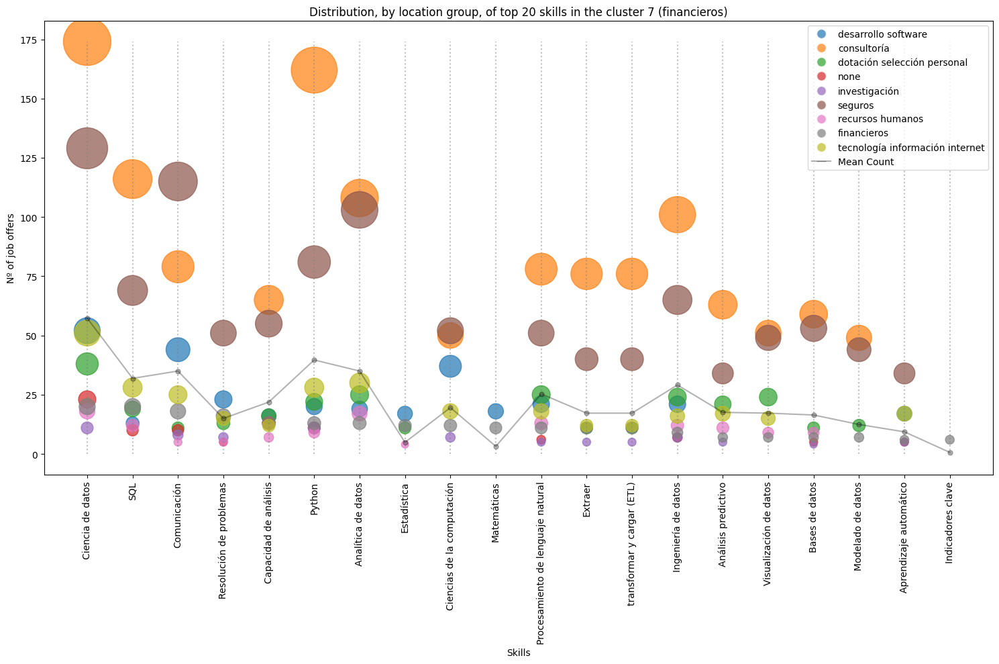

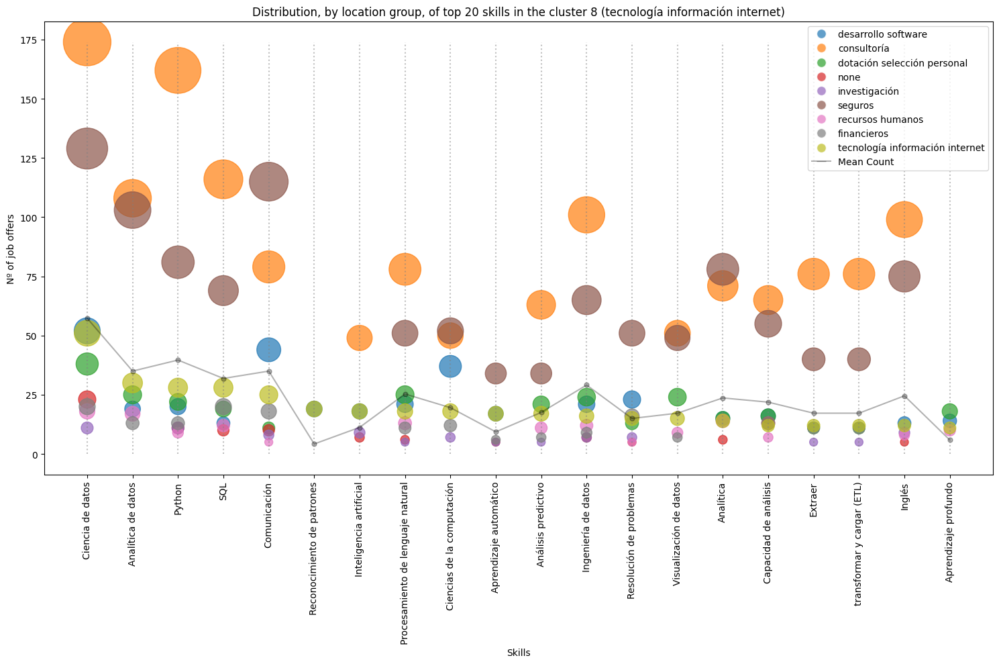

In [ ]:
for k in unique_skills.keys(): # Iterating over each cluster

    # Prepare for plotting
    grouped_jobs_df_plot = grouped_jobs_df.loc[:,unique_skills[k]].drop('Total') # Select the skills for the cluster and drop the 'Total' row
    skills = grouped_jobs_df_plot.columns # Extract the skills as x-axis labels
    colors = sns.color_palette("tab10", len(grouped_jobs_df_plot)) # Create an array of colors for each group
    plt.figure(figsize=(15, 10));legend_elements = [] # Config the size of the plot & Build a list to store the legend elements
    
    # Iterate over each group and draw a scatter plot for each one
    for i, (cluster, data) in enumerate(grouped_jobs_df_plot.iterrows()):
        cluster_skills = data.values # Extract the skill counts for the group
        plt.scatter(range(len(skills)), cluster_skills, s=cluster_skills*15, c=[colors[i]], alpha=0.7) # Scatter plot for the group
        legend_elements.append(plt.Line2D([0], [0], marker='o', color='w', markersize=10, markerfacecolor=colors[i], alpha=0.7, label=cluster_keyword_dict[cluster]))  # Add a legend
    
    # Draw the line for the mean skill counts
    total_counts = grouped_jobs_df.loc['Total', skills]/len(grouped_jobs_df_plot) # Obtaining the total skill counts
    plt.plot(range(len(skills)), total_counts, marker='o', markersize=5, color='black', alpha=0.3, label='Total') # Draw the line for the mean skill counts
    legend_elements.append(plt.Line2D([0], [0], marker='_', color='black', alpha=0.3, markersize=10, label='Mean Count')) # Add a legend
    
    # Add vertical lines at each point
    max_height = max(total_counts.max(), grouped_jobs_df_plot.max().max()) # Obtaining the maximum height of the vertical lines
    for i, count in enumerate(total_counts):
        plt.vlines(i, 0, max_height, colors='gray', linestyles='dotted', alpha=0.5)
    
    
    # Configure the plot
    plt.xticks(range(len(skills)), skills, rotation=90); plt.xlabel('Skills'); plt.ylabel('Nº of job offers')
    plt.title(f'Distribution, by location group, of top 20 skills in the cluster {k} ({cluster_keyword_dict[k]})')
    plt.legend(handles=legend_elements); plt.tight_layout(); plt.show() # Show the plot